#  <span style='color:DarkBlue'>P7 - Implémentez un modèle de scoring</span>

<div style="text-align:center">
    <img src="images/logo_proj7_credit.png" width="50%">
</div>>


# <span class='bg-primary'>P7_01 - EDA</span>

## <span style='background:PowderBlue' id="#section_2">1. Introduction</span>

In [1]:
# Chargement des librairies
import datetime
import sys
import time
from datetime import datetime
import warnings
#import jyquickhelper
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import fonctions_data
#import eda_kernel_fonctions
# import phik
# Plotly
import plotly
# import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Warnings
warnings.filterwarnings('ignore')
plotly.offline.init_notebook_mode(connected=True)

# %matplotlib inline
# # Chargement à chaud des librairies personnelles
# %load_ext autoreload
# %autoreload 2
# # Valide code pep8
# %load_ext pycodestyle_magic
# %pycodestyle_on
# %pycodestyle_off

# Versions
print('Version des librairies utilisées :')
print('Python                : ' + sys.version)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Outils dataframe      : ' + fonctions_data.__version__)
now = datetime.now().isoformat()
print('Lancé le           : ' + now)

Version des librairies utilisées :
Python                : 3.8.8 (default, Apr 13 2021, 15:08:03) [MSC v.1916 64 bit (AMD64)]
NumPy                 : 1.24.4
Pandas                : 1.5.3
Outils dataframe      : 0.0.0
Lancé le           : 2024-04-14T21:05:02.832973


## Importation des données

Les données sont décomposés en 8 fichiers selon le schéma de relation suivant:

![logo_schema_data.png](images/logo_schema_data.png)

## Description des fichiers

### Fichiers de données

1. **`application_{train|test}.csv`**
   - La table principale, divisée en deux fichiers pour Train (avec TARGET) et Test (sans TARGET).
   - Données statiques pour toutes les applications.
   - Une ligne représente un prêt dans notre échantillon de données.

2. **`bureau.csv`**
   - Tous les crédits antérieurs du client fournis par d'autres institutions financières signalés au bureau de crédit.
   - Pour chaque prêt de notre échantillon, il y a autant de lignes que le nombre de crédits que le client avait dans le Credit Bureau avant la date de la demande.

3. **`bureau_balance.csv`**
   - Soldes mensuels des crédits antérieurs au bureau de crédit.
   - Une ligne pour chaque mois d'historique de chaque crédit précédent signalé au bureau de crédit.

4. **`POS_CASH_balance.csv`**
   - Instantanés mensuels du solde des points de vente précédents et des prêts en espèces du demandeur avec Home Credit.
   - Une ligne pour chaque mois d'historique de chaque crédit précédent dans Home Credit lié aux prêts de notre échantillon.

5. **`credit_card_balance.csv`**
   - Aperçus mensuels du solde des cartes de crédit précédentes du demandeur avec Home Credit.
   - Une ligne pour chaque mois d'historique de chaque crédit précédent dans Home Credit lié aux prêts de notre échantillon.

6. **`previous_application.csv`**
   - Toutes les demandes précédentes de prêts immobiliers des clients qui ont des prêts dans notre échantillon.
   - Une ligne pour chaque demande précédente liée aux prêts dans notre échantillon de données.

7. **`installments_payments.csv`**
   - Historique de remboursement des crédits précédemment décaissés en Home Credit liés aux prêts de notre échantillon.
   - Une ligne pour chaque paiement effectué, plus une ligne pour chaque paiement manqué.

8. **`HomeCredit_columns_description.csv`**
   - Descriptions des colonnes des différents fichiers de données.
ts fichiers de données.

## <span style='background:PowderBlue' id="#section_2">2. Dataset</span>

**Chargement des fichiers**

In [2]:
# Importation des données train et test

train = pd.read_csv('home_credit_default_risk/application_train.csv')
test = pd.read_csv('home_credit_default_risk/application_test.csv')

In [3]:
# Créer une liste contenant les noms des fichiers
noms_fichiers = ['home_credit_default_risk/bureau.csv', 'home_credit_default_risk/bureau_balance.csv', \
                 'home_credit_default_risk/credit_card_balance.csv', 'home_credit_default_risk/installments_payments.csv', \
                 'home_credit_default_risk/POS_CASH_balance.csv']

# Pour chaque nom de fichier dans la liste, lire le fichier avec pandas
for nom_fichier in noms_fichiers:
    fichier = pd.read_csv(nom_fichier)
    print("Lecture du fichier : ", nom_fichier)
    print(fichier.head())
    print(fichier.shape)
    print("--------------------------------------------------")

Lecture du fichier :  home_credit_default_risk/bureau.csv
   SK_ID_CURR  SK_ID_BUREAU CREDIT_ACTIVE CREDIT_CURRENCY  DAYS_CREDIT  \
0      215354       5714462        Closed      currency 1         -497   
1      215354       5714463        Active      currency 1         -208   
2      215354       5714464        Active      currency 1         -203   
3      215354       5714465        Active      currency 1         -203   
4      215354       5714466        Active      currency 1         -629   

   CREDIT_DAY_OVERDUE  DAYS_CREDIT_ENDDATE  DAYS_ENDDATE_FACT  \
0                   0               -153.0             -153.0   
1                   0               1075.0                NaN   
2                   0                528.0                NaN   
3                   0                  NaN                NaN   
4                   0               1197.0                NaN   

   AMT_CREDIT_MAX_OVERDUE  CNT_CREDIT_PROLONG  AMT_CREDIT_SUM  \
0                     NaN                

**Vue d'ensemble**

In [4]:
# Vue d'ensemble des 9 jeux de données
# telechargment des 8 tables de l'organigramme

application_train = pd.read_csv('home_credit_default_risk/application_train.csv')
application_test = pd.read_csv('home_credit_default_risk/application_test.csv')
bureau = pd.read_csv('home_credit_default_risk/bureau.csv')
bureau_balance = pd.read_csv('home_credit_default_risk/bureau_balance.csv')
credit_card_balance = pd.read_csv('home_credit_default_risk/credit_card_balance.csv')
installment_payment = pd.read_csv('home_credit_default_risk/installments_payments.csv')
cash_balance = pd.read_csv('home_credit_default_risk/POS_CASH_balance.csv')
previous_application = pd.read_csv('home_credit_default_risk/previous_application.csv')
homecredit_columns_description = pd.read_csv('home_credit_default_risk/homecredit_columns_description.csv', encoding='latin-1')

dataframes = [application_train, application_test, bureau, bureau_balance,
              credit_card_balance, installment_payment, cash_balance,
              previous_application, homecredit_columns_description]
noms = ['application_train', 'application_test', 'bureau', 'bureau_balance',
        'cc_balance', 'installments_payments', 'POS_CASH_balance',
        'previous_application', 'HomeCredit_columns_description']
fonctions_data.resume_datasets(dataframes, noms)

Les données se décomposent en 9 fichier(s).


Jeu de données,Nb lignes,Nb variables,Nb nan,% nan,Nb var avec nan,Var avec nan
application_train,307511,122,9152465,24.395942,67,"AMT_ANNUITY, AMT_GOODS_PRICE, NAME_TYPE_SUITE, OWN_CAR_AGE, OCCUPATION_TYPE, CNT_FAM_MEMBERS, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, FONDKAPREMONT_MODE, HOUSETYPE_MODE, TOTALAREA_MODE, WALLSMATERIAL_MODE, EMERGENCYSTATE_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR"
application_test,48744,121,1404419,23.811687,64,"AMT_ANNUITY, NAME_TYPE_SUITE, OWN_CAR_AGE, OCCUPATION_TYPE, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, FONDKAPREMONT_MODE, HOUSETYPE_MODE, TOTALAREA_MODE, WALLSMATERIAL_MODE, EMERGENCYSTATE_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR"
bureau,1716428,17,3939947,13.502552,7,"DAYS_CREDIT_ENDDATE, DAYS_ENDDATE_FACT, AMT_CREDIT_MAX_OVERDUE, AMT_CREDIT_SUM, AMT_CREDIT_SUM_DEBT, AMT_CREDIT_SUM_LIMIT, AMT_ANNUITY"
bureau_balance,27299925,3,0,0.000000,0,
cc_balance,3840312,23,5877356,6.654074,9,"AMT_DRAWINGS_ATM_CURRENT, AMT_DRAWINGS_OTHER_CURRENT, AMT_DRAWINGS_POS_CURRENT, AMT_INST_MIN_REGULARITY, AMT_PAYMENT_CURRENT, CNT_DRAWINGS_ATM_CURRENT, CNT_DRAWINGS_OTHER_CURRENT, CNT_DRAWINGS_POS_CURRENT, CNT_INSTALMENT_MATURE_CUM"
installments_payments,13605401,8,5810,0.005338,2,"DAYS_ENTRY_PAYMENT, AMT_PAYMENT"
POS_CASH_balance,10001358,8,52158,0.065189,2,"CNT_INSTALMENT, CNT_INSTALMENT_FUTURE"
previous_application,1670214,37,11109336,17.976877,16,"AMT_ANNUITY, AMT_CREDIT, AMT_DOWN_PAYMENT, AMT_GOODS_PRICE, RATE_DOWN_PAYMENT, RATE_INTEREST_PRIMARY, RATE_INTEREST_PRIVILEGED, NAME_TYPE_SUITE, CNT_PAYMENT, PRODUCT_COMBINATION, DAYS_FIRST_DRAWING, DAYS_FIRST_DUE, DAYS_LAST_DUE_1ST_VERSION, DAYS_LAST_DUE, DAYS_TERMINATION, NFLAG_INSURED_ON_APPROVAL"
HomeCredit_columns_description,219,5,133,12.146119,1,Special


### <span style='background:orange'>2.1 Fichier application_train.csv</span>

#### <span style='background:Moccasin'>2.1.1. statistique des variables</span>

<span style='background:mistyrose'>**Compréhension des variables**</span>

In [5]:
df_var_appli_train = \
    homecredit_columns_description[homecredit_columns_description['Table']
                                   == 'application_{train|test}.csv']
df_var_appli_train.style.hide_index()

Unnamed: 0,Table,Row,Description,Special
1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,nan
2,application_{train|test}.csv,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",nan
5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,nan
6,application_{train|test}.csv,CODE_GENDER,Gender of the client,nan
7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,nan
8,application_{train|test}.csv,FLAG_OWN_REALTY,Flag if client owns a house or flat,nan
9,application_{train|test}.csv,CNT_CHILDREN,Number of children the client has,nan
10,application_{train|test}.csv,AMT_INCOME_TOTAL,Income of the client,nan
11,application_{train|test}.csv,AMT_CREDIT,Credit amount of the loan,nan
12,application_{train|test}.csv,AMT_ANNUITY,Loan annuity,nan


<span style='background:mistyrose'>**Statistiques**</span>

-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 122, dtype: object

,Nombre par type de variable,% des types de variable
float64,65,53.280000
int64,41,33.610000
object,16,13.110000


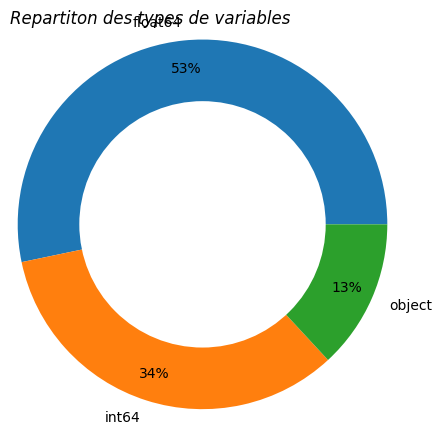

In [11]:
# Types des variables
fonctions_data.affichage_types_var(application_train, True, True, True)

In [12]:
# Résumé des variables qualitatives
fonctions_data.detail_type_var(application_train, type_var='cat')

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
type,object,object,object,object,object,object,object,object,object,object,object,object,object,object,object,object
nb_nan,0.0,0.0,0.0,0.0,1292.0,0.0,0.0,0.0,0.0,96391.0,0.0,0.0,210295.0,154297.0,156341.0,145755.0
%_nan,0.0,0.0,0.0,0.0,0.420148,0.0,0.0,0.0,0.0,31.345545,0.0,0.0,68.386172,50.176091,50.840783,47.398304
count,307511,307511,307511,307511,306219,307511,307511,307511,307511,211120,307511,307511,97216,153214,151170,161756
unique,2,3,2,2,7,8,5,6,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,278232,202448,202924,213312,248526,158774,218391,196432,272868,55186,53901,67992,73830,150503,66040,159428


In [13]:
# Résumé des variables qualitatives
fonctions_data.detail_type_var(application_train, type_var='num')

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
type,int64,int64,int64,float64,float64,float64,float64,float64,int64,int64,...,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,12.0,278.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,41519.0,41519.0,41519.0,41519.0,41519.0,41519.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.003902,0.090403,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,13.501631,13.501631,13.501631,13.501631,13.501631,13.501631
count,307511.0,307511.0,307511.0,307511.0,307511.0,307499.0,307233.0,307511.0,307511.0,307511.0,...,307511.0,307511.0,307511.0,307511.0,265992.0,265992.0,265992.0,265992.0,265992.0,265992.0
mean,278180.518577,0.080729,0.417052,168797.919297,599025.999706,27108.573909,538396.207429,0.020868,-16036.995067,63815.045904,...,0.00813,0.000595,0.000507,0.000335,0.006402,0.007,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,237123.146279,402490.776996,14493.737315,369446.46054,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.0,0.0,0.0,25650.0,45000.0,1615.5,40500.0,0.00029,-25229.0,-17912.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,189145.5,0.0,0.0,112500.0,270000.0,16524.0,238500.0,0.010006,-19682.0,-2760.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,278202.0,0.0,0.0,147150.0,513531.0,24903.0,450000.0,0.01885,-15750.0,-1213.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
75%,367142.5,0.0,1.0,202500.0,808650.0,34596.0,679500.0,0.028663,-12413.0,-289.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0


Valeurs manquantes :9152465 NaN pour 37516342 données (24.4 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
COMMONAREA_MEDI,214865,69.87
COMMONAREA_AVG,214865,69.87
COMMONAREA_MODE,214865,69.87
NONLIVINGAPARTMENTS_MEDI,213514,69.43
NONLIVINGAPARTMENTS_MODE,213514,69.43
...,...,...
EXT_SOURCE_2,660,0.21
AMT_GOODS_PRICE,278,0.09
DAYS_LAST_PHONE_CHANGE,1,0.00
CNT_FAM_MEMBERS,2,0.00


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


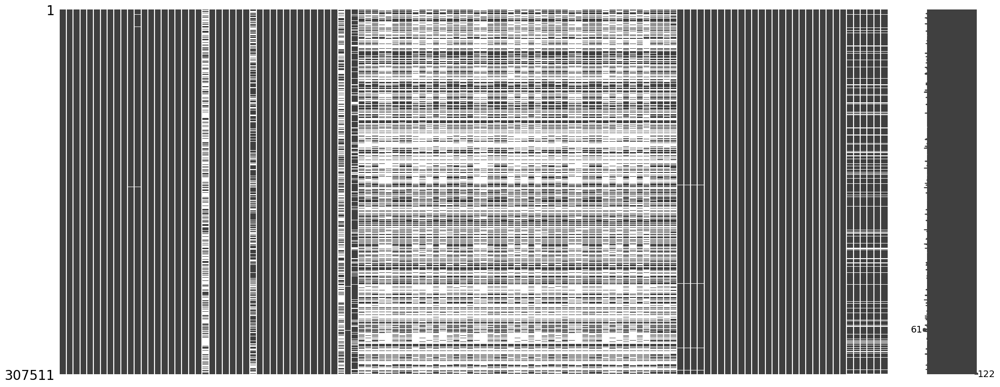

In [14]:
# Visualisation des données manquantes dans le dataset
fonctions_data.get_val_manq(application_train, True, True)

**Bilan** :
***
- On peut voir sur le graphique ci-dessus que 67 variables sur 122 contiennent des valeurs manquantes. 
- S'il n'y avait qu'une ou deux colonnes contenant des valeurs manquantes, nous aurions pu nous en sortir en éliminant simplement ces variables, mais pour un si grand nombre de colonnes, nous ne pouvons pas les éliminer telles quelles, car la perte d'information pourrait être très élevée.
- Nous voyons que certaines variables comme celles relatives à "COMMONAREA", "NONLIVINGAPARTMENT", etc. ont près de 70% de valeurs manquantes. Nous devrions trouver des techniques pour gérer ces nombreuses valeurs manquantes et voir ce qui fonctionne le mieux pour nos données.
- Une autre chose à noter ici est que la plupart des variables qui ont plus de 50% de valeurs manquantes sont liées aux statistiques sur les appartements de l'emprunteur. Il est très probable que ces valeurs n'aient pas été enregistrées lors de la saisie des données et qu'elles soient facultatives.

#### <span style='background:Moccasin'>2.1.2. Analyse univariée des colonnes</span>

<span style='background:mistyrose'>**Distribution de la variable TARGET**</span>

In [16]:
target_distribution = application_train.TARGET.value_counts()
target_distribution

0    282686
1     24825
Name: TARGET, dtype: int64

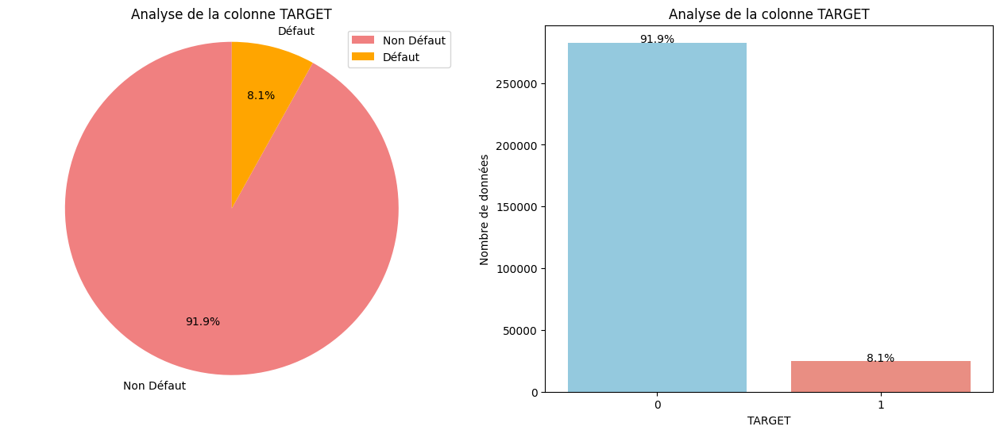

In [29]:
# Création des subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16,6))

# Graphique 1 : représentation en pourcentage
labels = ['Non Défaut', 'Défaut']
values = application_train.TARGET.value_counts().values.tolist()
pie = ax1.pie(values, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.7, colors=["lightcoral", "orange"])
ax1.set_title("Analyse de la colonne TARGET")
ax1.axis('equal')

# Ajout de la légende pour le pie chart
ax1.legend(pie[0], labels, loc="best")

# Graphique 2 : représentation en nombre avec des pourcentages
sns.countplot(x='TARGET', data=train, ax=ax2, palette=["skyblue", "salmon"])

# Calcul des pourcentages pour chaque catégorie
total = float(len(train))
for p in ax2.patches:
    height = p.get_height()
    ax2.text(p.get_x() + p.get_width() / 2., height + 0.5, '{:.1f}%'.format((height / total) * 100), ha="center")

ax2.set_title("Analyse de la colonne TARGET")
ax2.set_ylabel("Nombre de données")

# Affichage des graphiques
plt.show()


**Bilan** :
***
- D'après la **distribution de la variable cible** une chose que nous pouvons rapidement remarquer est le **déséquilibre des données**. 
- Il n'y a que 8,1% du total des prêts qui ont été mis en défaut. Cela signifie que les **défaillants** constituent la **classe minoritaire**.
- D'un autre côté, il y a 91,9% de prêts qui n'ont pas été en défaut. Ainsi, les **Non-Défaillants** seront notre **classe majoritaire**.
- Les défaillants se sont vus attribuer une variable cible de 1 et les non-défaillants une variable cible de 0.
- Cette situation va avoir un impact très important sur notre analyse de données. Il sera fondamentale de traiter cette problématique lors de notre modélisation..

<span style='background:violet'>**Analyse des données catégorielles**</span>

In [6]:
# Sélection des colonnes catégorielles

obj_cols = application_train.select_dtypes(include=['object']).columns
application_train_obj = application_train[obj_cols]

application_train_obj.head(2)

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,reg oper account,block of flats,"Stone, brick",No
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,reg oper account,block of flats,Block,No


In [7]:
# comptage le nombre de valeurs uniques dans chaque colonne

for col in application_train_obj.columns:
    print(col, application_train_obj[col].nunique())

NAME_CONTRACT_TYPE 2
CODE_GENDER 3
FLAG_OWN_CAR 2
FLAG_OWN_REALTY 2
NAME_TYPE_SUITE 7
NAME_INCOME_TYPE 8
NAME_EDUCATION_TYPE 5
NAME_FAMILY_STATUS 6
NAME_HOUSING_TYPE 6
OCCUPATION_TYPE 18
WEEKDAY_APPR_PROCESS_START 7
ORGANIZATION_TYPE 58
FONDKAPREMONT_MODE 4
HOUSETYPE_MODE 3
WALLSMATERIAL_MODE 7
EMERGENCYSTATE_MODE 2


In [34]:
application_train_obj.columns

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
       'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'],
      dtype='object')

<span style='background:mistyrose'>**Variable NAME_CONTRACT_TYPE**</span>

Cash loans         278232
Revolving loans     29279
Name: NAME_CONTRACT_TYPE, dtype: int64


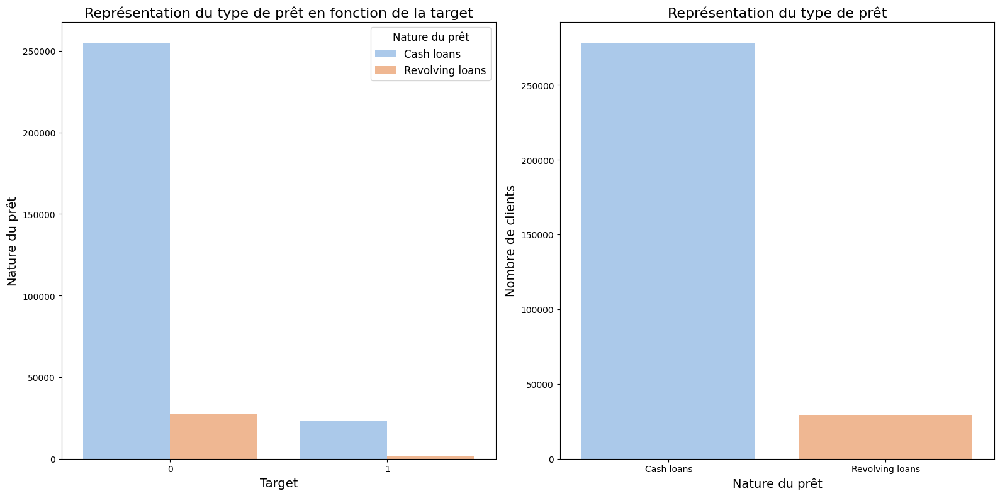

In [8]:
# Utilisation de la fonction avec les données d'application_train et la variable NAME_CONTRACT_TYPE
fonctions_data.plot_type_analysis(application_train, 'NAME_CONTRACT_TYPE')

<span style='background:mistyrose'>**Variable CODE_GENDER**</span>

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64


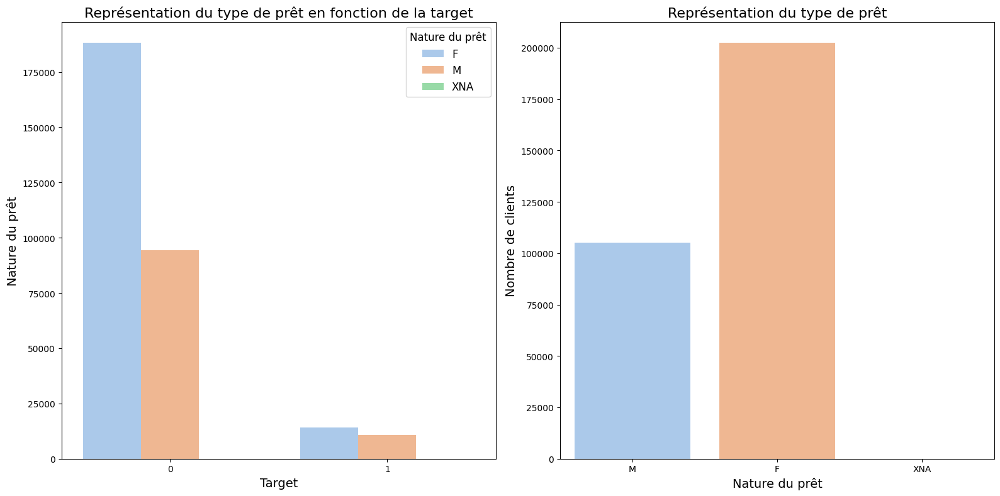

In [9]:
fonctions_data.plot_type_analysis(application_train, 'CODE_GENDER')

<span style='background:mistyrose'>**Variable FLAG_OWN_CAR**</span>

N    202924
Y    104587
Name: FLAG_OWN_CAR, dtype: int64


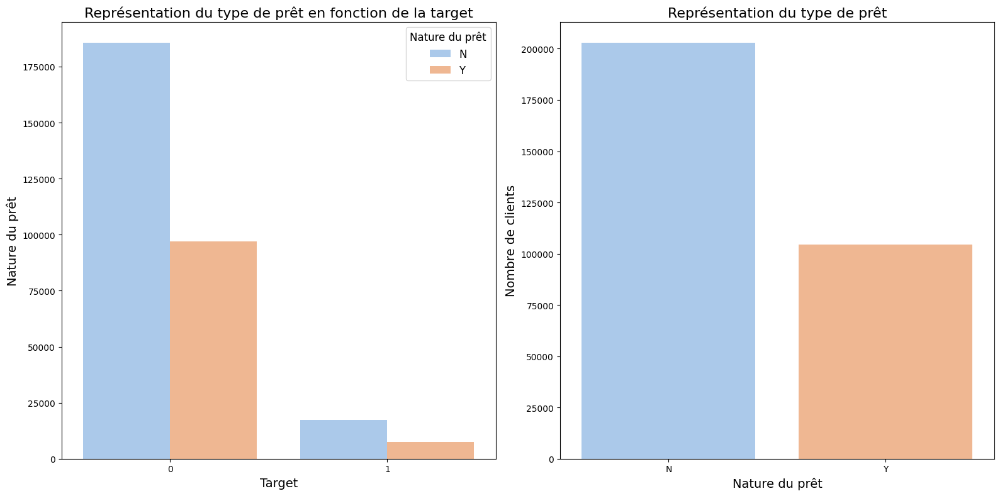

In [15]:
fonctions_data.plot_type_analysis(application_train, 'FLAG_OWN_CAR')

<span style='background:mistyrose'>**Variable FLAG_OWN_REALTY**</span>

Y    213312
N     94199
Name: FLAG_OWN_REALTY, dtype: int64


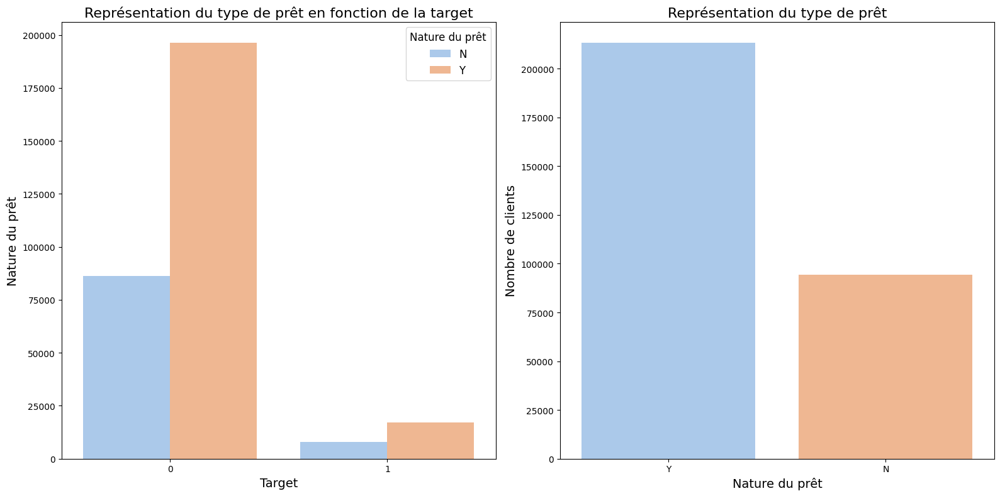

In [14]:
fonctions_data.plot_type_analysis(application_train, 'FLAG_OWN_REALTY')

<span style='background:mistyrose'>**Variable NAME_TYPE_SUITE**</span>

Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64


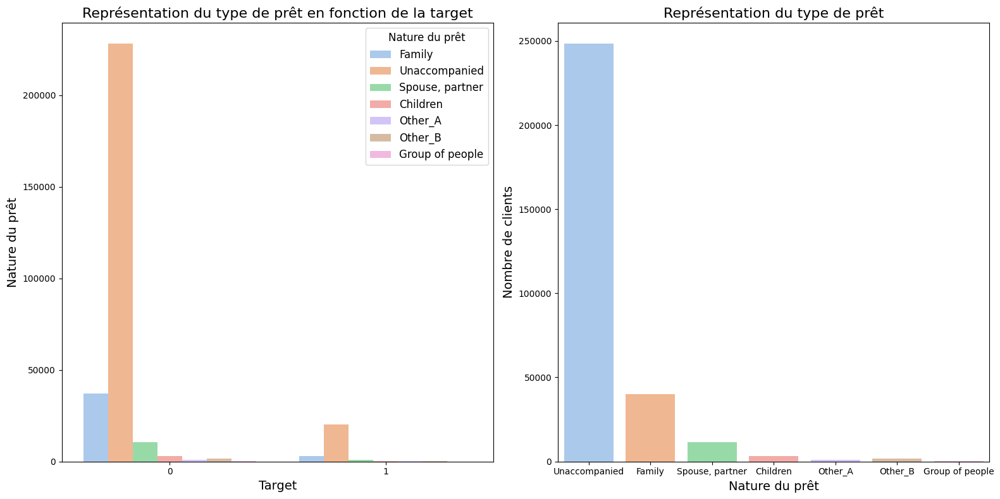

In [16]:
fonctions_data.plot_type_analysis(application_train, 'NAME_TYPE_SUITE')

<span style='background:mistyrose'>**Variable NAME_EDUCATION_TYPE**</span>

Secondary / secondary special    218391
Higher education                  74863
Incomplete higher                 10277
Lower secondary                    3816
Academic degree                     164
Name: NAME_EDUCATION_TYPE, dtype: int64


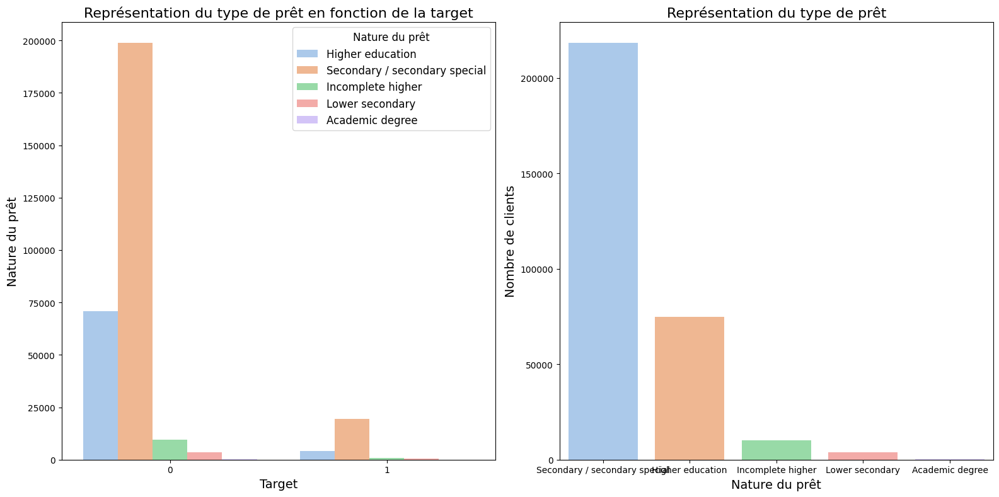

In [17]:
fonctions_data.plot_type_analysis(application_train, 'NAME_EDUCATION_TYPE')

<span style='background:mistyrose'>**Variable NAME_INCOME_TYPE**</span>

Working                 158774
Commercial associate     71617
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64


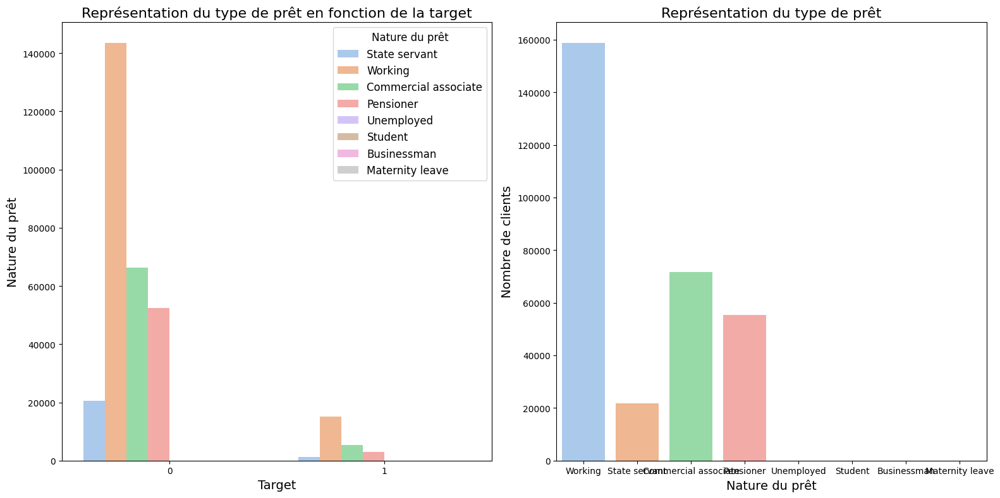

In [19]:
fonctions_data.plot_type_analysis(application_train, 'NAME_INCOME_TYPE')

<span style='background:mistyrose'>**Variable NAME_FAMILY_STATUS**</span>

Married                 196432
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64


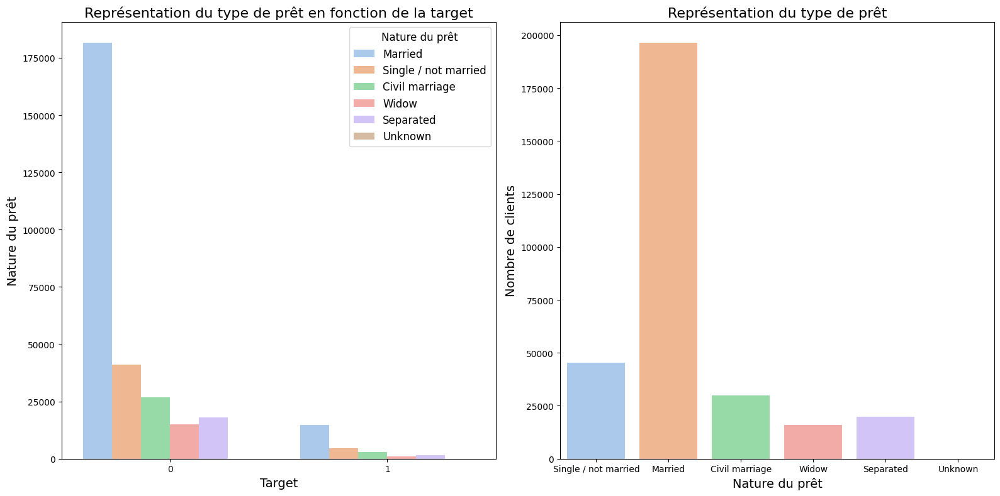

In [20]:
fonctions_data.plot_type_analysis(application_train, 'NAME_FAMILY_STATUS')

<span style='background:mistyrose'>**Variable NAME_HOUSING_TYPE**</span>

House / apartment      272868
With parents            14840
Municipal apartment     11183
Rented apartment         4881
Office apartment         2617
Co-op apartment          1122
Name: NAME_HOUSING_TYPE, dtype: int64


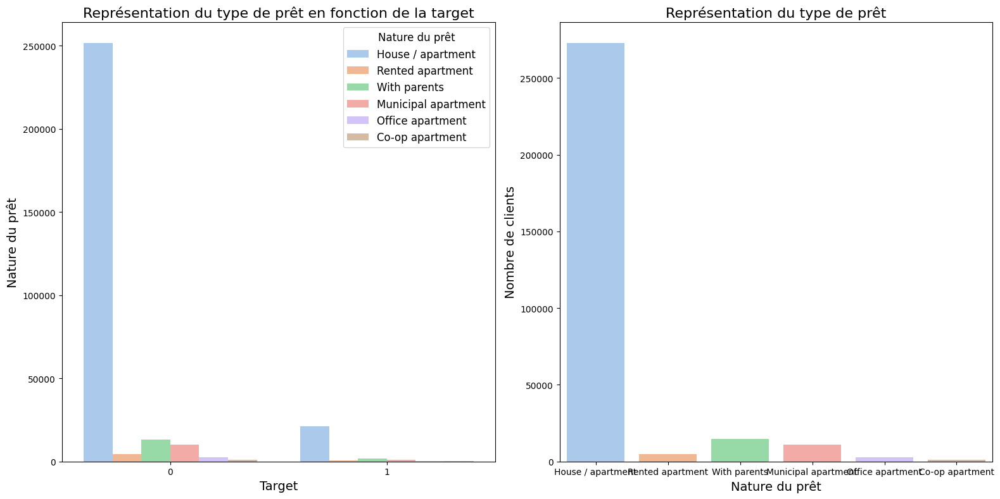

In [22]:
fonctions_data.plot_type_analysis(application_train, 'NAME_HOUSING_TYPE')

<span style='background:mistyrose'>**Variable OCCUPATION_TYPE**</span>

Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64


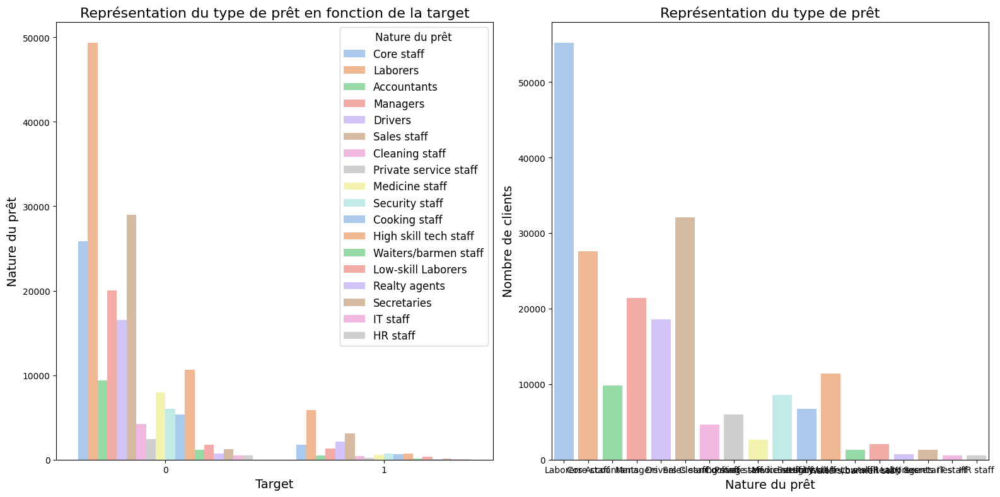

In [23]:
fonctions_data.plot_type_analysis(application_train, 'OCCUPATION_TYPE')

<span style='background:mistyrose'>**Variable WEEKDAY_APPR_PROCESS_START**</span>

TUESDAY      53901
WEDNESDAY    51934
MONDAY       50714
THURSDAY     50591
FRIDAY       50338
SATURDAY     33852
SUNDAY       16181
Name: WEEKDAY_APPR_PROCESS_START, dtype: int64


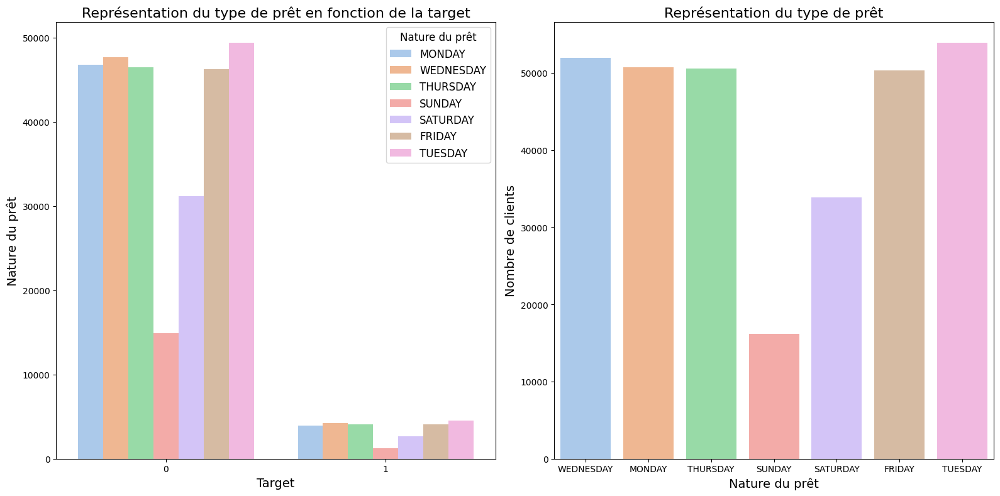

In [24]:
fonctions_data.plot_type_analysis(application_train, 'WEEKDAY_APPR_PROCESS_START')

<span style='background:mistyrose'>**Variable ORGANIZATION_TYPE**</span>

In [26]:
# Analyse de la variable ORGANIZATION_TYPE
print(application_train['ORGANIZATION_TYPE'].value_counts())

# Cette variable a un trop grand nombres de données pour permettre une analyse

Business Entity Type 3    67992
XNA                       55374
Self-employed             38412
Other                     16683
Medicine                  11193
Business Entity Type 2    10553
Government                10404
School                     8893
Trade: type 7              7831
Kindergarten               6880
Construction               6721
Business Entity Type 1     5984
Transport: type 4          5398
Trade: type 3              3492
Industry: type 9           3368
Industry: type 3           3278
Security                   3247
Housing                    2958
Industry: type 11          2704
Military                   2634
Bank                       2507
Agriculture                2454
Police                     2341
Transport: type 2          2204
Postal                     2157
Security Ministries        1974
Trade: type 2              1900
Restaurant                 1811
Services                   1575
University                 1327
Industry: type 7           1307
Transpor

<span style='background:mistyrose'>**Variable HOUSETYPE_MODE**</span>

block of flats      150503
specific housing      1499
terraced house        1212
Name: HOUSETYPE_MODE, dtype: int64


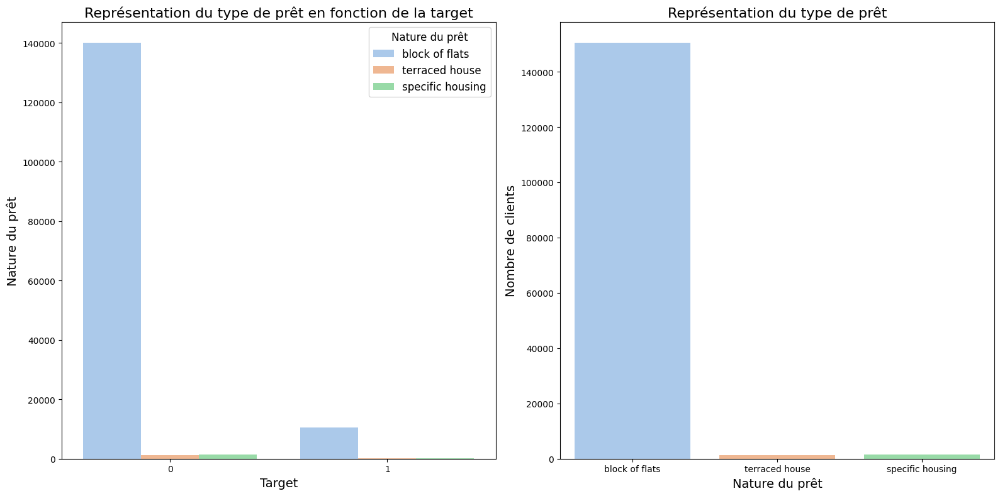

In [28]:
fonctions_data.plot_type_analysis(application_train, 'HOUSETYPE_MODE')

Cette colonne précise le type de batiments.

<span style='background:mistyrose'>**Variable WALLSMATERIAL_MODE**</span>

Panel           66040
Stone, brick    64815
Block            9253
Wooden           5362
Mixed            2296
Monolithic       1779
Others           1625
Name: WALLSMATERIAL_MODE, dtype: int64


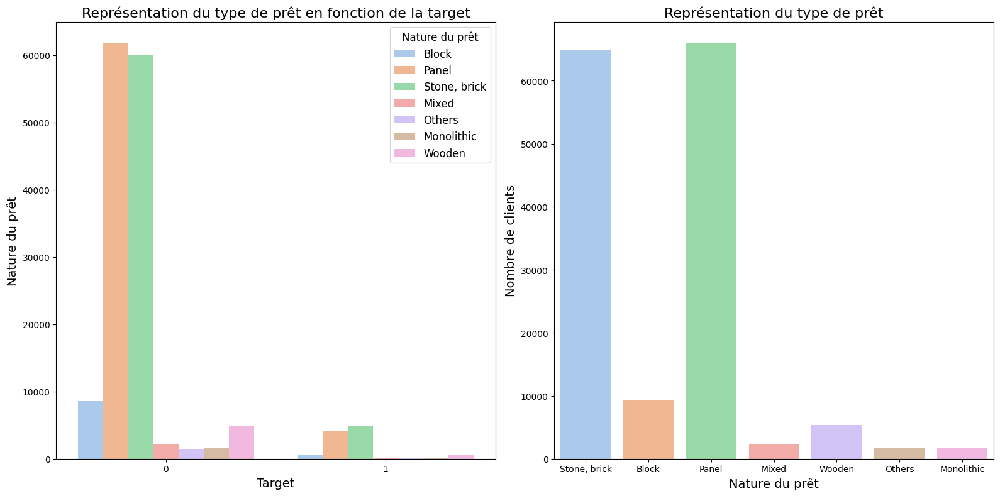

In [29]:
fonctions_data.plot_type_analysis(application_train, 'WALLSMATERIAL_MODE')

Cette colonne précise la composition des murs.s.

<span style='background:mistyrose'>**Variable FLAG_EMP_PHONE**</span>

1    252125
0     55386
Name: FLAG_EMP_PHONE, dtype: int64


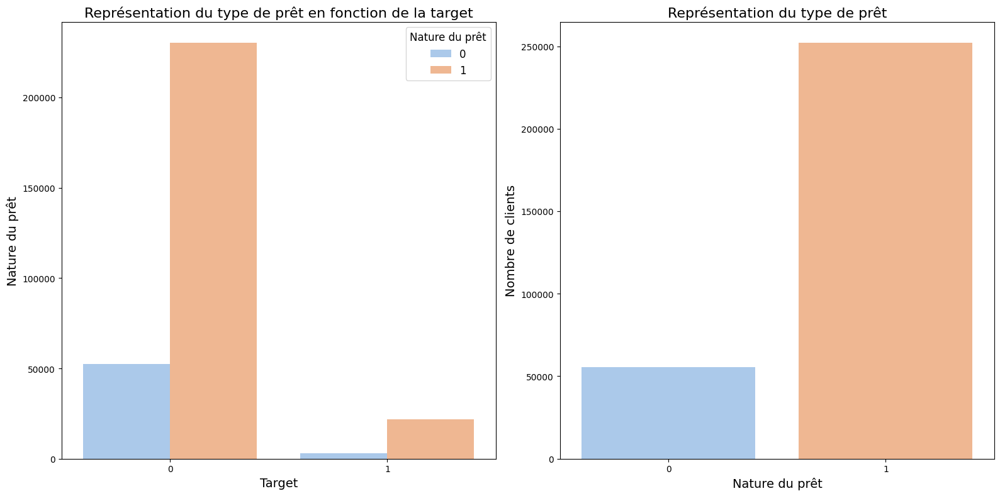

In [13]:
fonctions_data.plot_type_analysis(application_train, 'FLAG_EMP_PHONE')

<span style='background:mistyrose'>**Variable REGION_RATING_CLIENT_W_CITY**</span>

2    229484
3     43860
1     34167
Name: REGION_RATING_CLIENT_W_CITY, dtype: int64


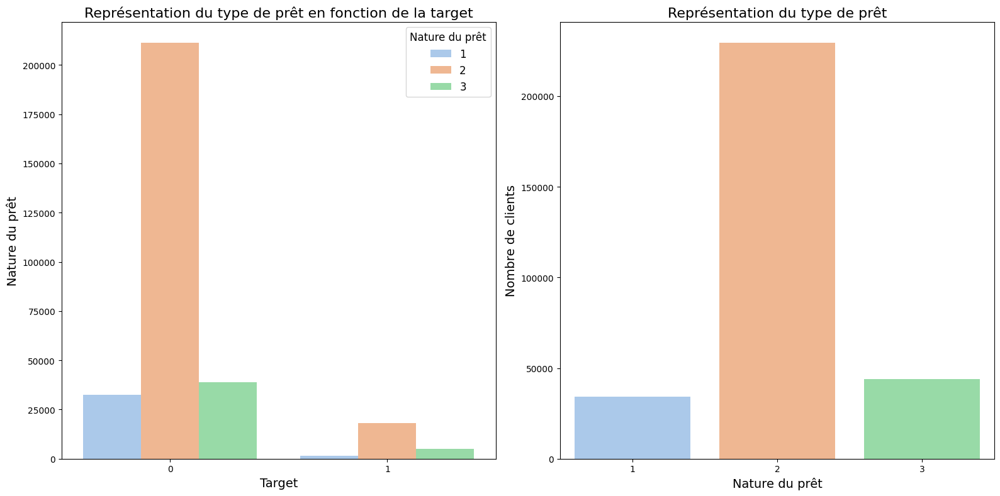

In [12]:
fonctions_data.plot_type_analysis(application_train, 'REGION_RATING_CLIENT_W_CITY')

<span style='background:violet'>**Analyse des variables quantitatives**</span>

In [6]:
# Liste des variables quantitatives
cols_num = \
    application_train.select_dtypes(include=[np.number]).columns.to_list()
cols_num

['SK_ID_CURR',
 'TARGET',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAR

<span style='background:mistyrose'>**Variable DAYS_BIRTH**</span>

- Âge du demandeur en jours au moment de la demande.
- Pour l'ensemble de données donné, l'âge est indiqué en jours, ce qui peut être plus difficile à interpréter. 
- Nous allons donc créer une variable latente pour stocker les âges en années, ce qui sera plus facile à analyser et à interpréter.

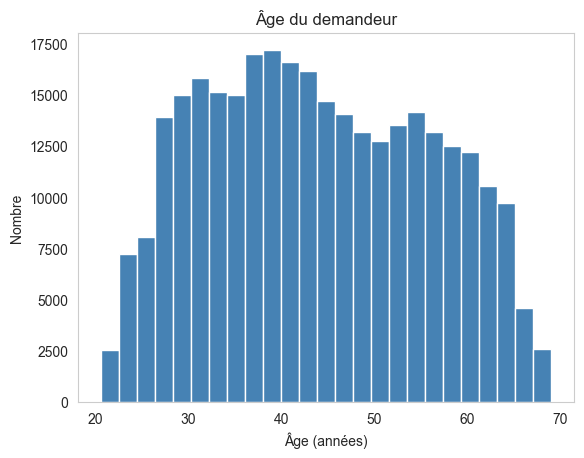

In [94]:
plt.hist(application_train['DAYS_BIRTH']*-1/365, color='SteelBlue',
         bins=25)
plt.title('Âge du demandeur')
plt.xlabel('Âge (années)')
plt.ylabel('Nombre')
plt.grid(False)
plt.show()

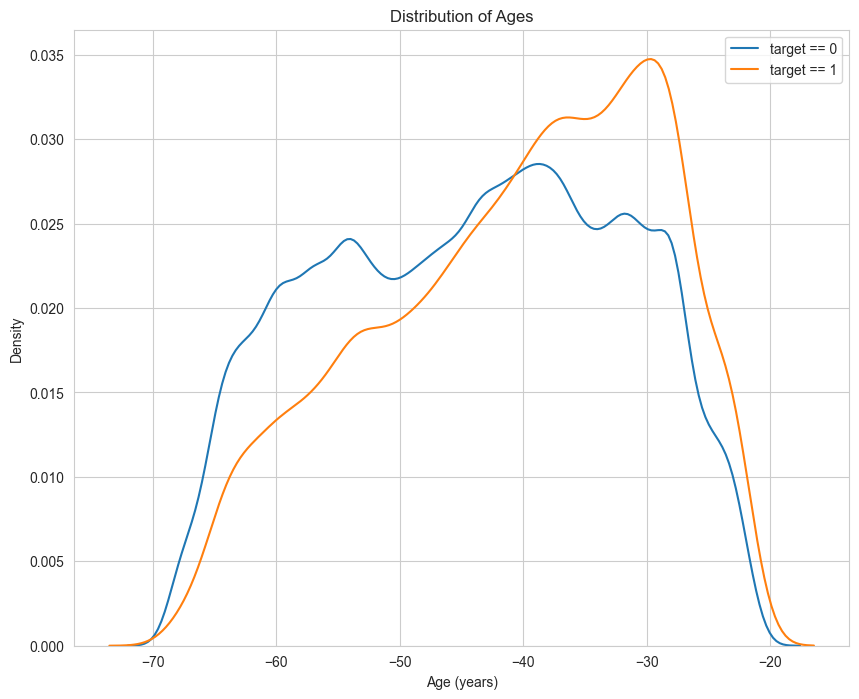

In [97]:
plt.figure(figsize = (10, 8))

# KDE plot of loans that were repaid on time
sns.kdeplot(application_train.loc[application_train['TARGET'] == 0, 'DAYS_BIRTH'] / 365, label = 'target == 0')

# KDE plot of loans which were not repaid on time
sns.kdeplot(application_train.loc[application_train['TARGET'] == 1, 'DAYS_BIRTH'] / 365, label = 'target == 1')

plt.legend()

# Labeling of plot
plt.xlabel('Age (years)'); plt.ylabel('Density'); plt.title('Distribution of Ages');

In [5]:
# Transformer l'âge en années à partir du nombre de jours
application_train['AGE_YEARS'] = \
    application_train['DAYS_BIRTH'] * -1 / 365

-------------------------------------------------------------------------------
Pecentiles de la variable AGE_YEARS
Pecentile 0 = 20.517808219178082
Pecentile 25 = 34.00821917808219
Pecentile 50 = 43.15068493150685
Pecentile 75 = 53.92328767123288
Pecentile 90 = 60.76986301369863
Pecentile 92 = 61.87397260273973
Pecentile 94 = 62.99452054794521
Pecentile 96 = 64.1945205479452
Pecentile 98 = 65.6027397260274
Pecentile 100 = 69.12054794520547
-------------------------------------------------------------------------------


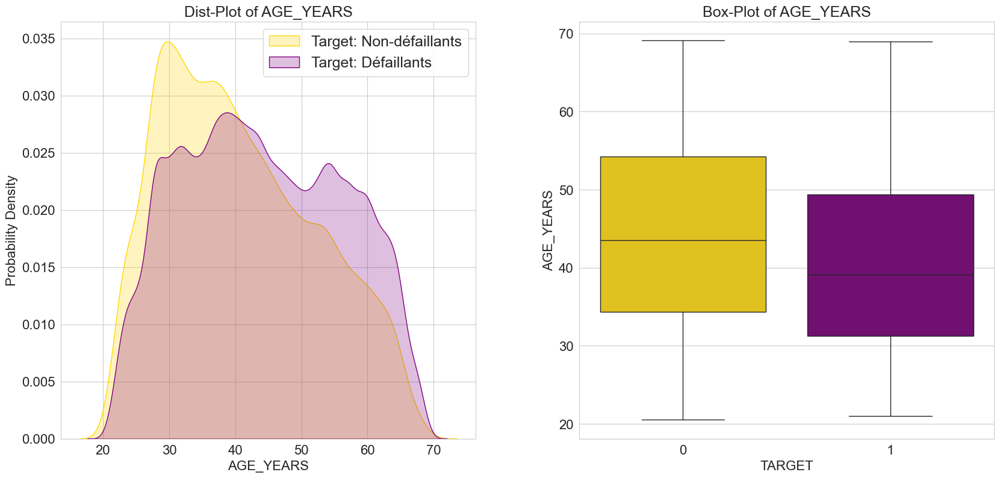

In [6]:
# Affiche les quantiles
fonctions_data.print_percentiles(application_train, 'AGE_YEARS')
# Affiche boxplot, distplot pour l'âge
fonctions_data.plot_continuous_variables(application_train, 'AGE_YEARS', plots=['distplot', 'box'])
# Suppression de la variable nouvellement ajoutée
_ = application_train.pop('AGE_YEARS')

<span style='background:mistyrose'>**Variable DAYS_EMPLOYED**</span>

- Cette variable indique le nombre de jours depuis le jour de la demande où le demandeur a été employé.- 
Pour faciliter l'interprétation, nous allons convertir les jours en années.

In [7]:
# Transformer en années à partir du nombre de jours
application_train['YEARS_EMPLOYED'] = \
    application_train['DAYS_EMPLOYED'] * -1 / 365

-------------------------------------------------------------------------------
Pecentiles de la variable YEARS_EMPLOYED
Pecentile 0 = -1000.6657534246575
Pecentile 25 = 0.7917808219178082
Pecentile 50 = 3.3232876712328765
Pecentile 75 = 7.561643835616438
Pecentile 90 = 13.372602739726027
Pecentile 92 = 14.726027397260275
Pecentile 94 = 16.958904109589042
Pecentile 96 = 20.134246575342466
Pecentile 98 = 25.15068493150685
Pecentile 100 = 49.07397260273972
-------------------------------------------------------------------------------


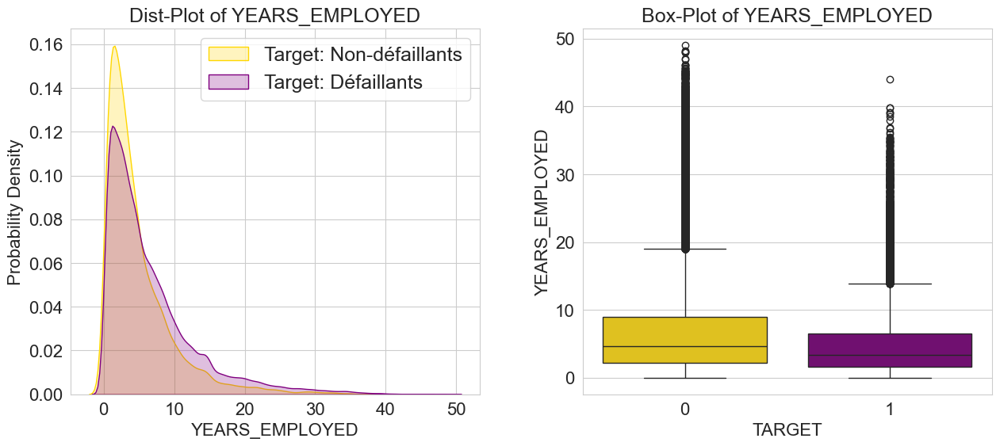

In [8]:
# Afficher les quantiles
fonctions_data.print_percentiles(application_train, 'YEARS_EMPLOYED')
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'YEARS_EMPLOYED', plots=['distplot', 'box'],
                                               figsize=(15, 6), scale_limits=[0, 70])

- 
Sur le boxplot, nous observons que les défaillants semblent avoir moins d'années d'emploi que les non-défaillants. Tous les quantiles 25, 50 et 75 des défaillants sont inférieurs à ceux des non-défaillants.

<span style='background:mistyrose'>**Variable DAYS_REGISTRATION**</span>

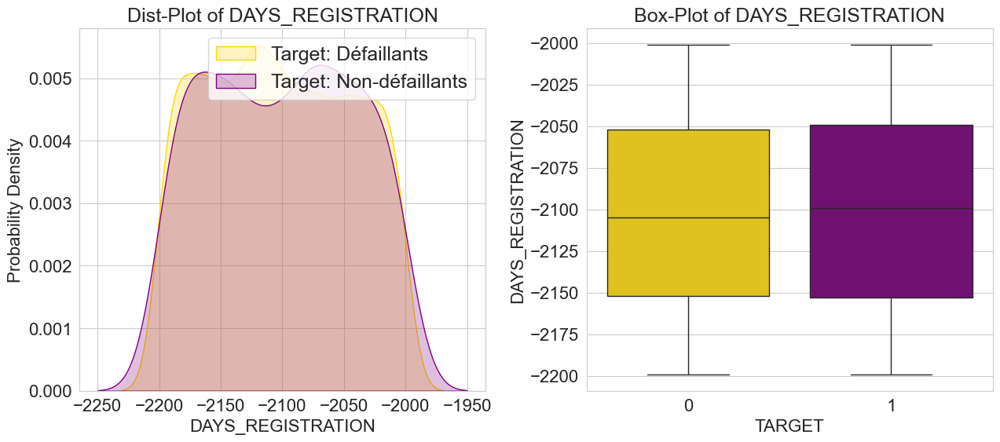

In [9]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'DAYS_REGISTRATION', plots=['distplot', 'box'],
                          scale_limits=[-2200, -2000], figsize=(15, 6))

- Le boxplot montre que le nombre de jours écoulés depuis le dernier enregistrement de modification de la demande des défaillants est généralement inférieur.
- Les non défaillants affichent un nombre de jours plus élevé pour tous les quantiles depuis qu'ils ont changé leur document d'identité.

<span style='background:mistyrose'>**Variable DAYS_ID_PUBLISH**</span>

Cette variable indique depuis combien de jours, à partir du jour de l'enregistrement, le demandeur a changé le document d'identité avec lequel il a demandé le prêt.

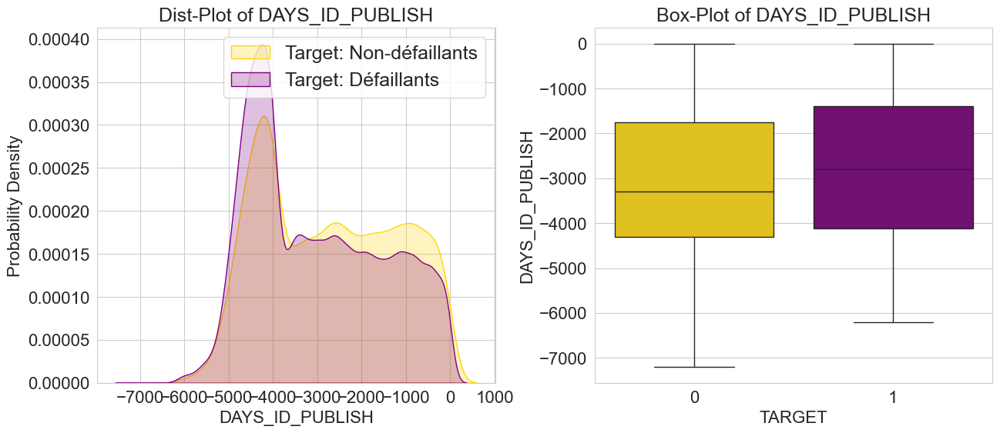

In [10]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'DAYS_ID_PUBLISH', plots=['distplot', 'box'], figsize=(15, 6))

- Le boxplot montre une tendance similaire à celle de DAYS_REGISTRATION, où le nombre de jours écoulés depuis le changement d'identité des défaillants est généralement inférieur.- 
Les non défaillants affichent un nombre de jours plus élevé de dernier enregistrement de la demande pour tous les quantiles.

<span style='background:mistyrose'>**Variable EXT_SOURCES_1, EXT_SOURCES_2, EXT_SOURCES_3**</span>

- Il existe trois colonnes EXT_SOURCES, qui contiennent des valeurs comprises entre 0 et 1. 
- Il s'agit de scores normalisés provenant de différentes sources pour lesquels nous n'avons pas plus d'information.

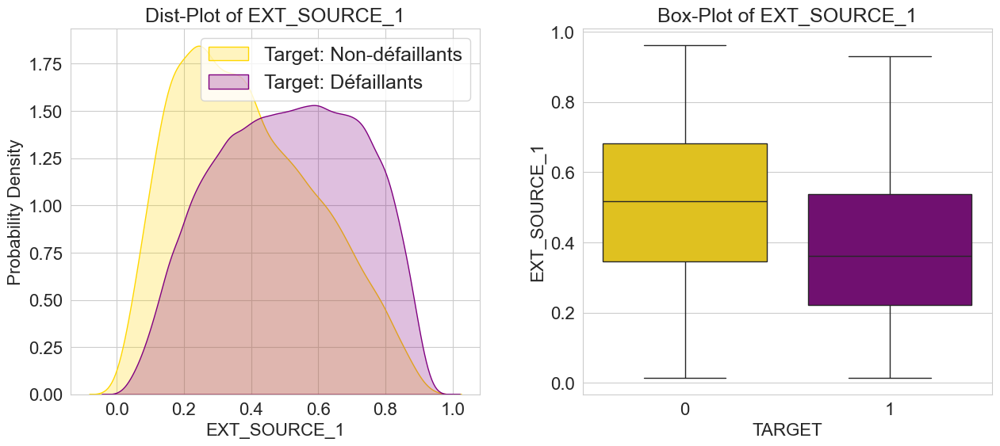

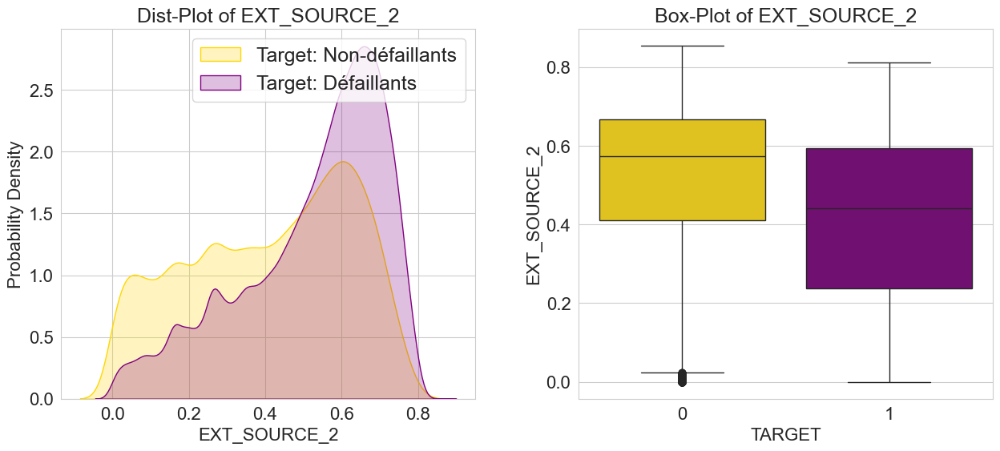

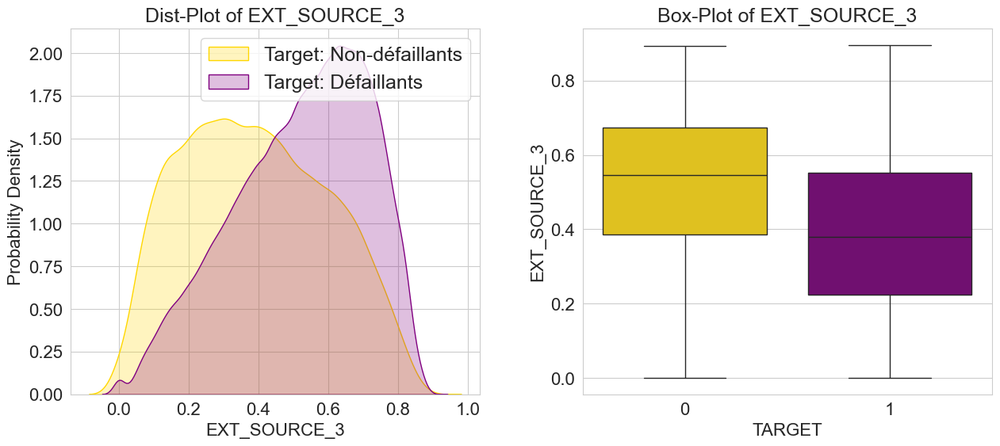

In [11]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'EXT_SOURCE_1', plots=['distplot', 'box'], figsize=(15, 6))

fonctions_data.plot_continuous_variables(application_train, 'EXT_SOURCE_2', plots=['distplot', 'box'], figsize=(15, 6))

fonctions_data.plot_continuous_variables(application_train, 'EXT_SOURCE_3', plots=['distplot', 'box'], figsize=(15, 6))

- Sur les boxplots, il y a une tendance similaire pour les 3 variables 'EXT_SOURCES', à savoir que les valeurs des défaillants ont tendance à avoir des valeurs considérablement plus basses que les non-défaillants.
- Cette tendance peut également être observée avec les densités de probabilité. Les non-défaillants montrent un pic plus élevé pour les valeurs élevées de EXT_SOURCE, et les densités de probabilité sont très faibles pour les valeurs faibles. Cela implique que les non-défaillants ont généralement des valeurs élevées pour ces scores..
Les variables EXT_SOURCE_1 et EXT_SOURCE_3 tendent à montrer une meilleure discrimination/séparabilité par rapport à la variable EXT_SOURCE_t. 

<span style='background:mistyrose'>**Variable FLOORSMAX_AVG**</span>

Cette variable décrit les scores normalisés de la moyenne du nombre maximum d'étages dans le bâtiment du demandeur.

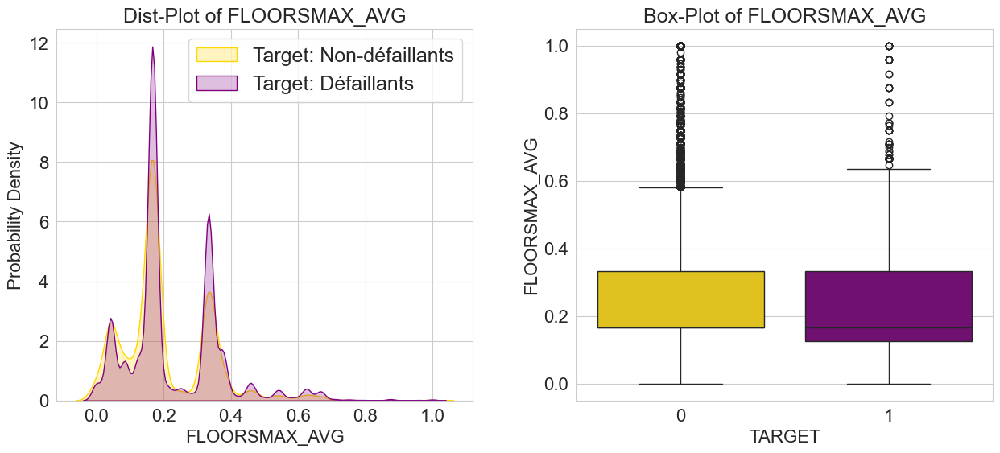

In [12]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'FLOORSMAX_AVG', plots=['distplot', 'box'], figsize=(15, 6))

- La valeur médiane de la caractéristique FLOORSMAX_AVG inférieure à celle des non-défaillants.
- Les valeurs hautes (75e percentile) des défaillants et des non-défaillants sont plus ou moins les mêmes, mais les valeurs basses (25e percentile) des non-défaillants est presque supérieure à la médiane des défaillants.

<span style='background:mistyrose'>**Variable FLOORSMAX_MEDI**</span>

Cette variable décrit les scores normalisés de la médiane du nombre maximum d'étages dans le bâtiment du demandeur.


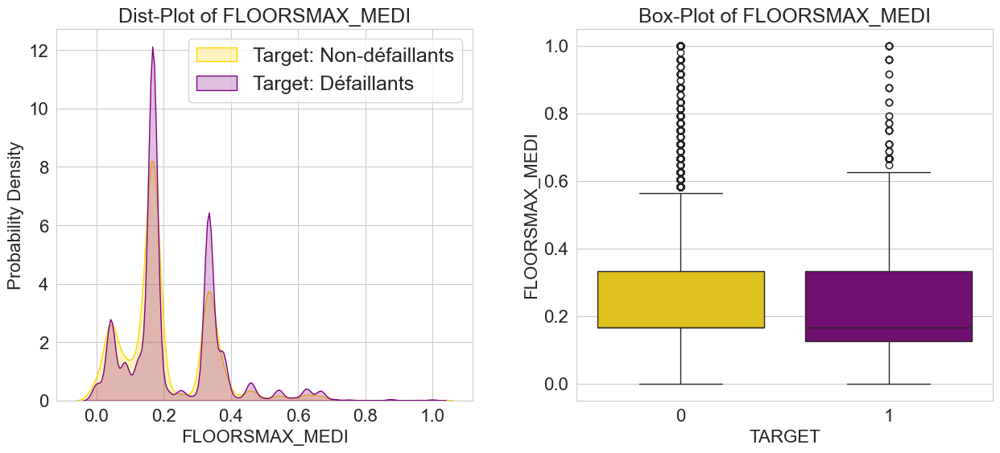

In [13]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'FLOORSMAX_MEDI', plots=['distplot', 'box'], figsize=(15, 6))

- On constate les memes tendances pour cette variable, que celle précédamment.

<span style='background:mistyrose'>**Variable FLOORSMAX_MODE**</span>

Il décrit les scores du mode du nombre maximum d'étages dans le bâtiment du demandeur

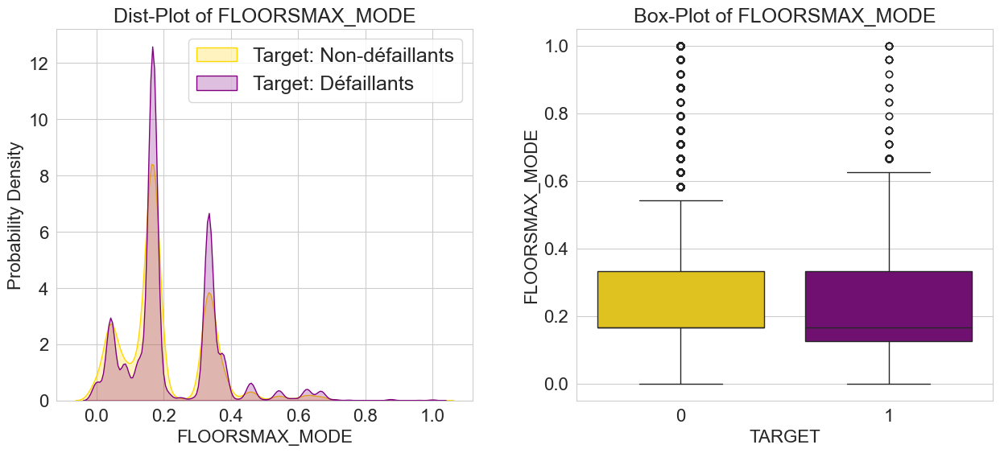

In [14]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'FLOORSMAX_MODE', plots=['distplot', 'box'], figsize=(15, 6))

- Meme analyse que les précédentes variables 'FLOORSMAX_MEDI' et 'FLOORSMAX_AVG' 

<span style='background:mistyrose'>**Variable  FLOORSMIN_MODE**</span>

 Scores normalisés du mode du nombre minimum d'étages dans le bâtiment du demandeur.

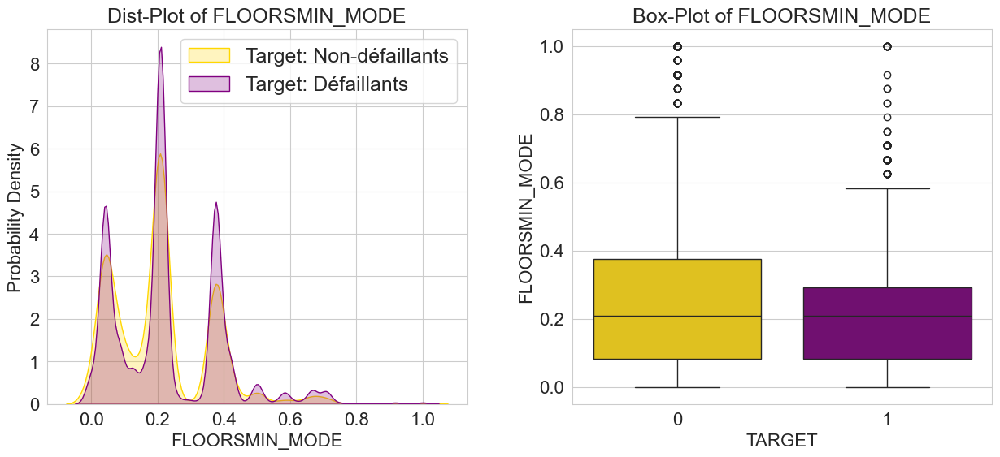

In [15]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'FLOORSMIN_MODE', plots=['distplot', 'box'], figsize=(15, 6))

- Les non-défaillants ont tendance à montrer une valeur plus élevée de FLOORSMIN_MODE par rapport aux défaillants: les valeurs hautes (75e percentile) sont sensiblement plus élevés du coté des non-défaillants que les défaillants.

<span style='background:mistyrose'>**Variable FLOORSMIN_AVG**</span>

les scores normalisés de la moyenne du nombre minimum d'étages dans le bâtiment du demandeur.

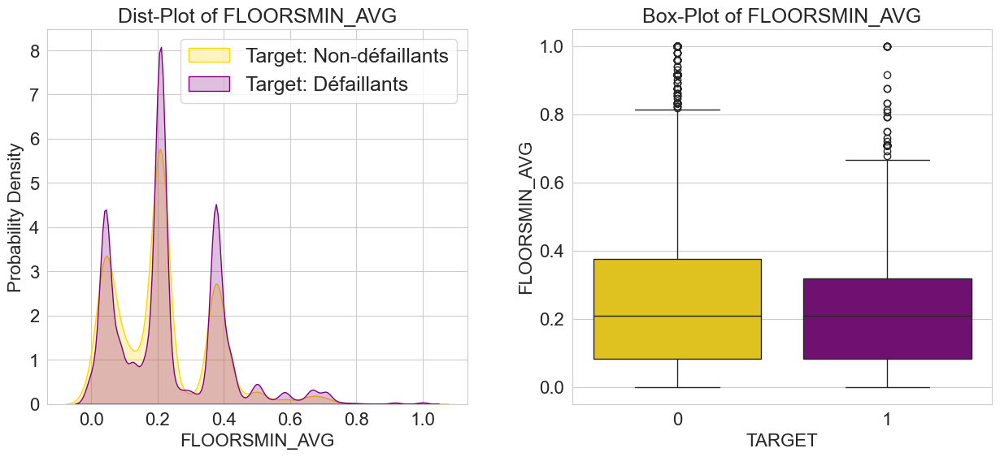

In [16]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'FLOORSMIN_AVG', plots=['distplot', 'box'], figsize=(15, 6))

- Les non-défaillants ont tendance à montrer une valeur plus élevée de FLOORSMIN_AVG par rapport aux défaillants: les valeurs hautes (75e percentile) sont sensiblement plus élevés du coté des non-défaillants que les défaillants.

<span style='background:mistyrose'>**Variable FLOORSMIN_MEDI**</span>

Scores normalisés de la médiane du nombre minimum d'étages dans le bâtiment du demandeur.

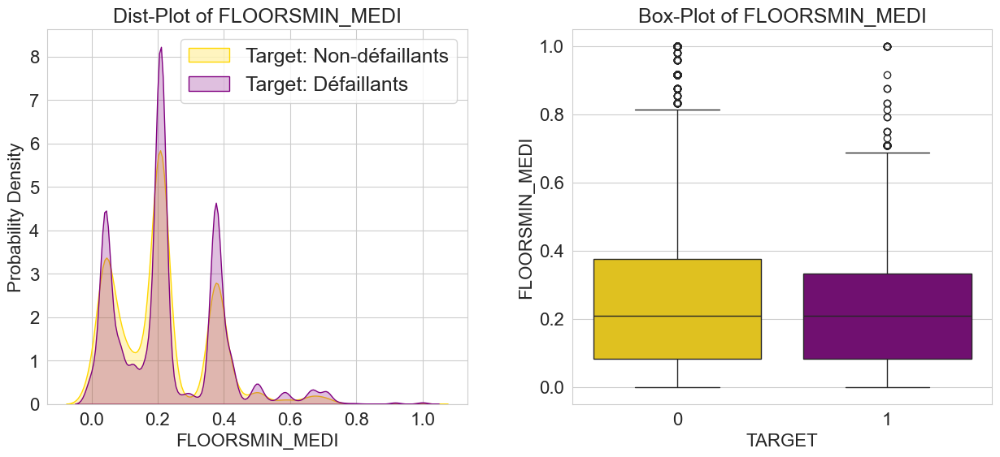

In [17]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'FLOORSMIN_MEDI', plots=['distplot', 'box'], figsize=(15, 6))

- Les non-défaillants ont tendance à montrer une valeur plus élevée de FLOORSMIN_MEDI par rapport aux défaillants: les valeurs hautes (75e percentile) sont sensiblement plus élevés du coté des non-défaillants que les défaillants.

<span style='background:mistyrose'>**Variable AMT_GOODS_PRICE**</span>

Prix du bien que le demandeur a demandé (le cas échéant) sur la demande précédent.

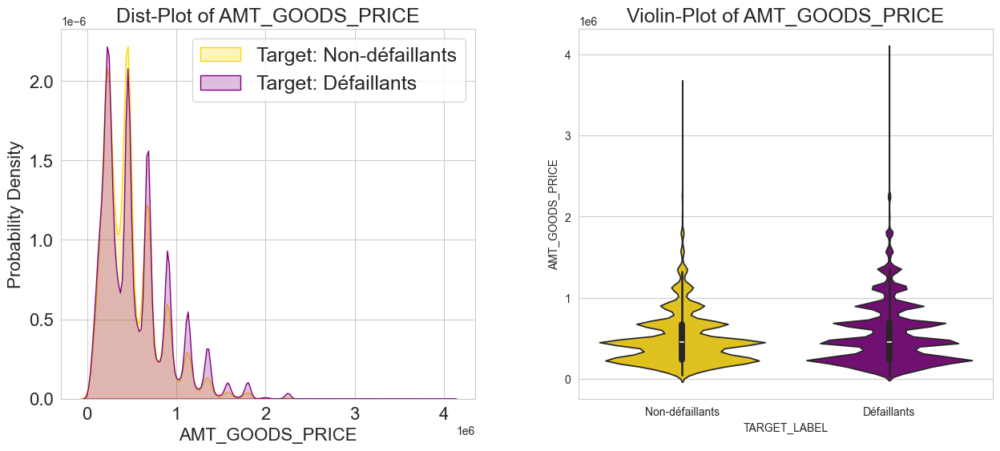

In [18]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'AMT_GOODS_PRICE', plots=['distplot', 'violin'], figsize=(15, 6))

- Les différents quantiles ont pratiquement la même valeur pour les défaillants que pour les non-défaillants.
- Variable non significative pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:mistyrose'>**Variable  CNT_CHILDREN**</span>

- Nombre d'enfants du demandeur.

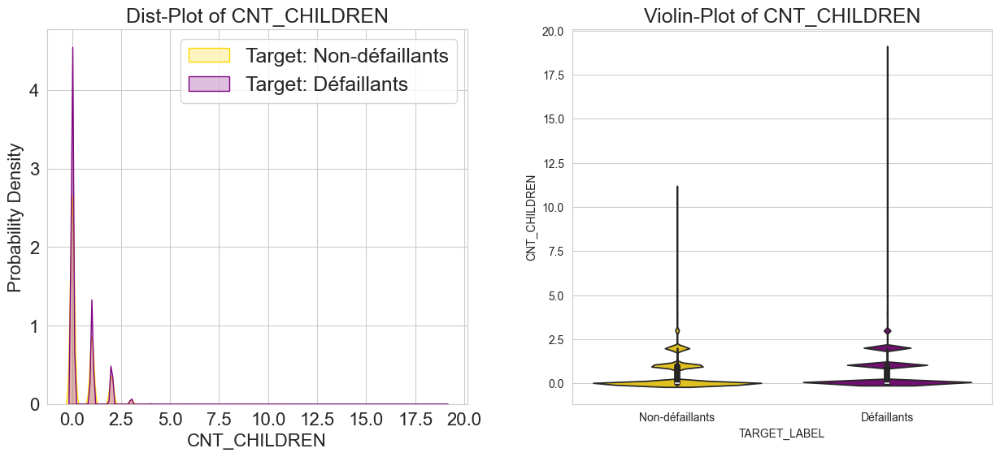

In [19]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'CNT_CHILDREN', plots=['distplot', 'violin'], figsize=(15, 6))

- Les différents quantiles ont pratiquement la même valeur pour les défaillants que pour les non-défaillants.- 
Variable non significative pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:mistyrose'>**Variable AMT_INCOME_TOTAL**</span>

- Niveau de revenu global

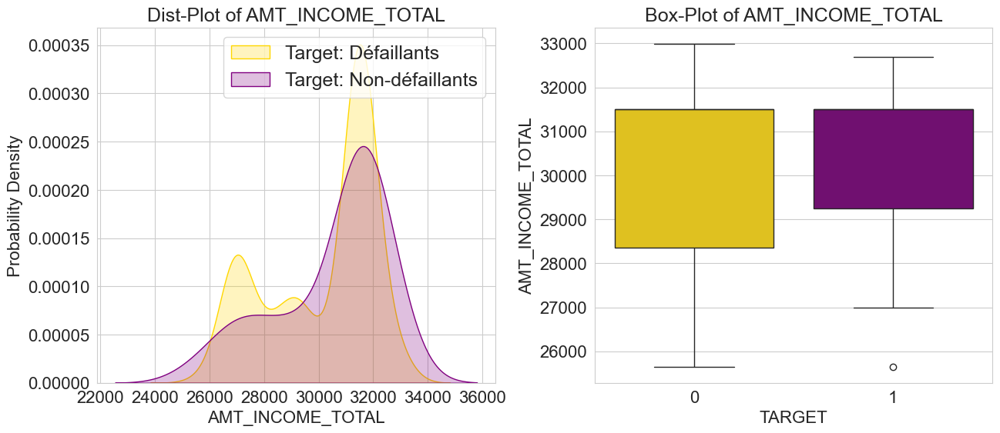

In [20]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'AMT_INCOME_TOTAL', plots=['distplot', 'box'], figsize=(15, 6),  scale_limits=[0, 33e3])

- Les défaillants n'ont pas forcément plus de revenus que les défaillants, les valeurs basses (25e quantiles) sont plus élévés du
  coté des défaillants par rapport aux non-défaillants.

<span style='background:mistyrose'>**Variable AMT_CREDIT**</span>

- Montant du crédit

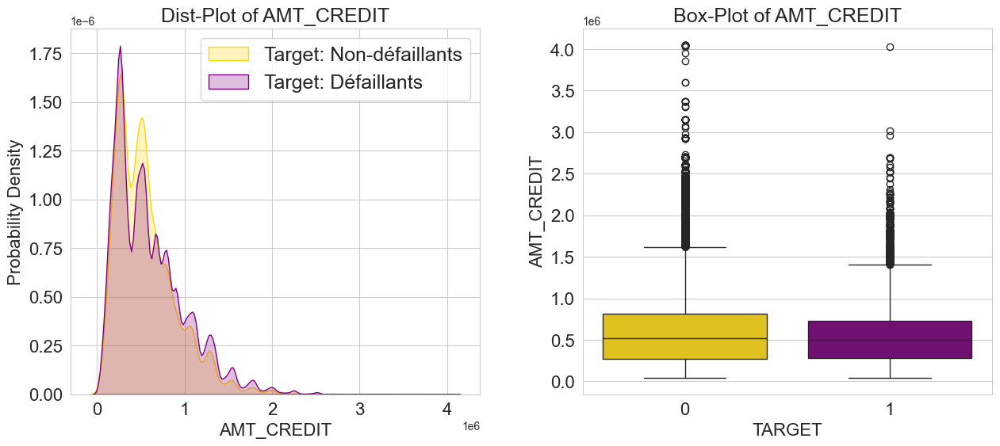

In [21]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'AMT_CREDIT', plots=['distplot', 'box'], figsize=(15, 6))

- Meme étendue de valeur au niveau des crédits alloueés concernant les quartiles, pour les défaillants, et non-défaillants, si ce n'est pour le quartile le plus élevé avec légèrement plus de prets alloués par les non-défaillants.

<span style='background:mistyrose'>**Variable AMT_ANNUITY**</span>

- Annuité du crédit

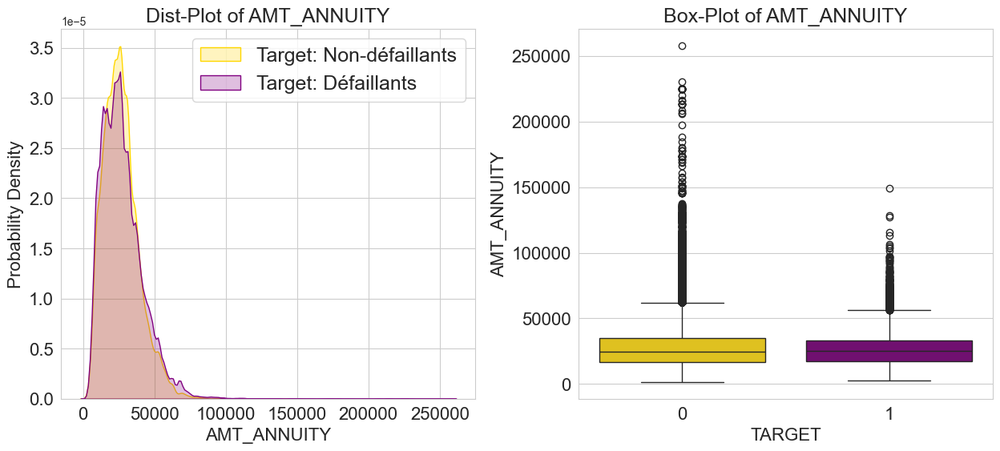

In [22]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'AMT_ANNUITY', plots=['distplot', 'box'], figsize=(15, 6))

- Meme niveau d'attribution concernant l'annuité des prets, quelque soit les défaillants

<span style='background:mistyrose'>**Variable REGION_POPULATION_RELATIVE**</span>

- Population normalisée de la région où vit le demandeur (un chiffre plus élevé signifie que le demandeur vit dans une région plus peuplée).

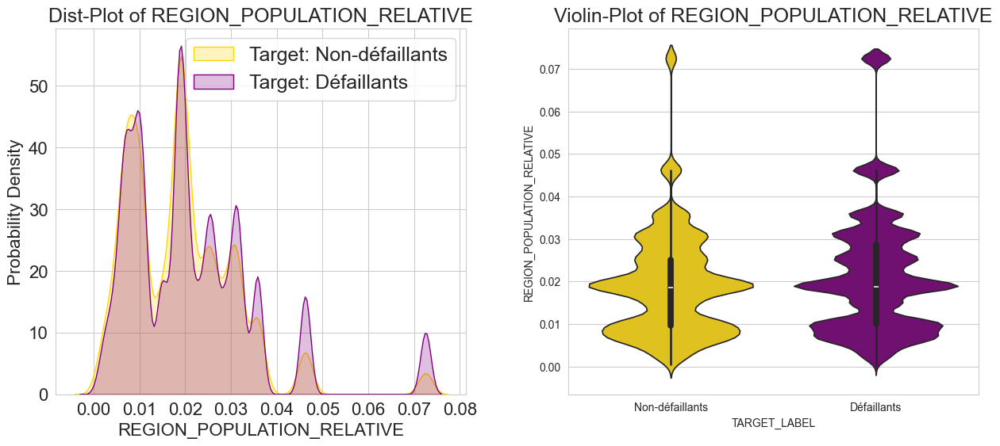

In [23]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'REGION_POPULATION_RELATIVE', plots=['distplot', 'violin'], figsize=(15, 6))

- Aucun écart concernant le niveau de population d'une région donnée, quelque soit le type de défaillant (défaillants et non-défaillants)

<span style='background:mistyrose'>**Variable  OWN_CAR_AGE**</span>

- Ancienneté du véhicule du demandeur

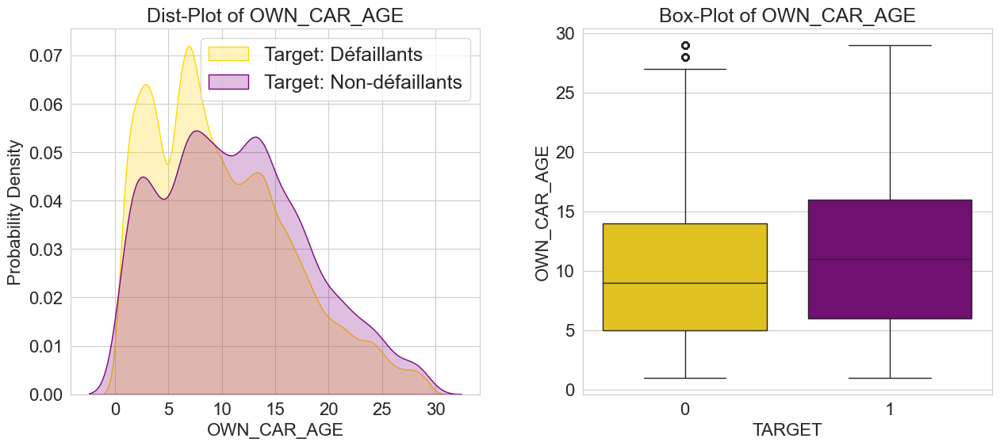

In [25]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'OWN_CAR_AGE', plots=['distplot', 'box'], figsize=(15, 6),
                                               scale_limits=[0, 30])

- Des véhicules plus anciennes pour les défaillants, les véhicules récents sont repertoriés auprès des non-défaillants.
- La variable sépare donc les 2 catégories.

<span style='background:mistyrose'>**Variable  CNT_FAM_MEMBERS**</span>

- Nombre de membres de la famille du demandeur(couple, grande famille,...)

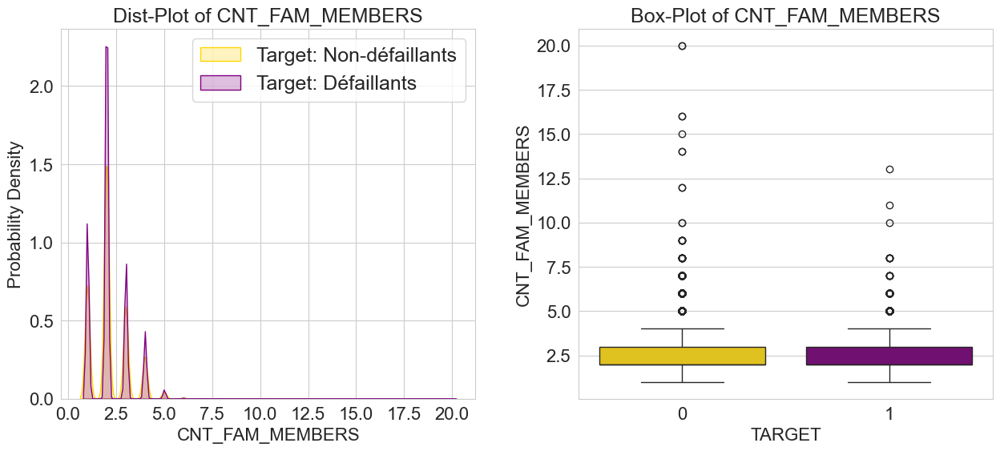

In [26]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'CNT_FAM_MEMBERS', plots=['distplot', 'box'], figsize=(15, 6))

- Peu de différence concernant la taille du foyer entre les non-défaillants et défaillants au niveau des quartiles
- Un foyer légèrement plus important pour les non-défaillants, avec une probabilité plus importante d'obtenir un foyer de 2,3 membres par rapport aux non-défaillants

<span style='background:mistyrose'>**Variable REGION_RATING_CLIENT**</span>

- Evaluation (qualité) de la région du demandeur

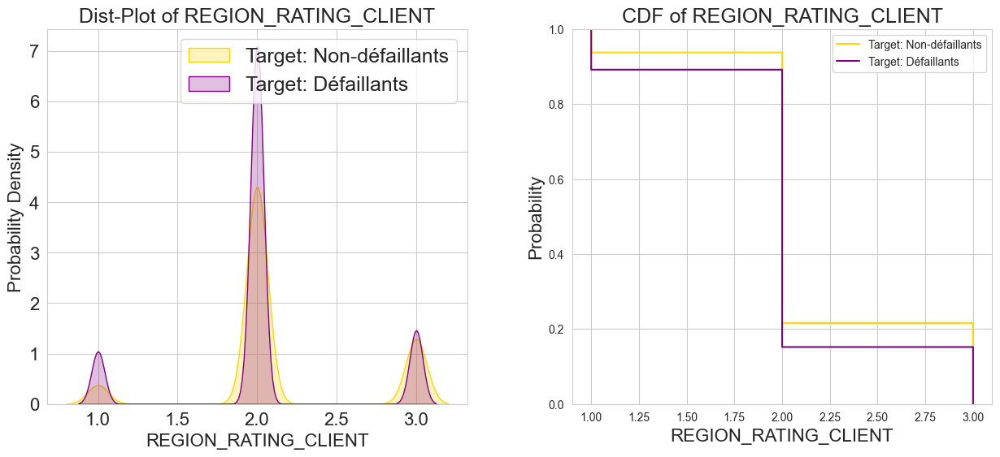

In [27]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'REGION_RATING_CLIENT', plots=['distplot', 'CDF'], figsize=(15, 6))

- Les meilleurs notes concerant la qualité de la région se penche en faveur des non-défaillants, mais avec un faible écart.

<span style='background:mistyrose'>**Variable REG_REGION_NOT_LIVE_REGION**</span>

- Variable binaire (0,1) sur la non-attribution ou non de l'adresse du demandeur à celui de la région  

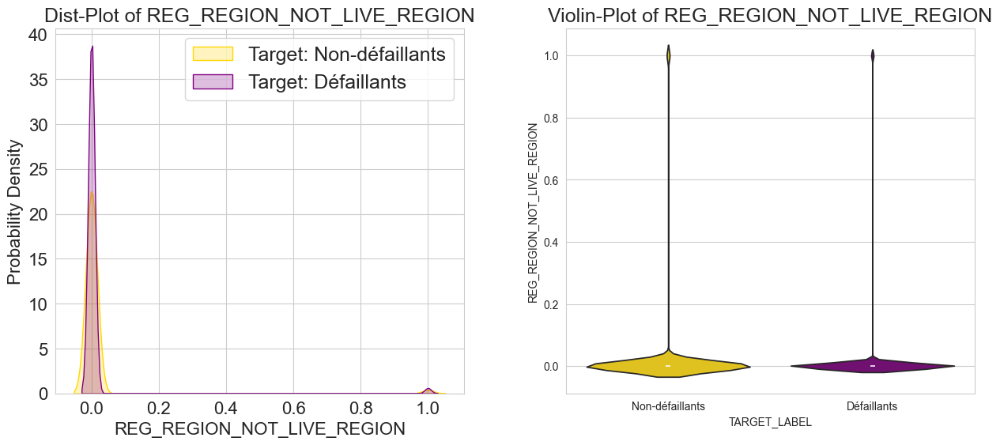

In [28]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'REG_REGION_NOT_LIVE_REGION', plots=['distplot', 'violin'], figsize=(15, 6))

- Aucune difference ou incidence sur les catégories

<span style='background:mistyrose'>**Variable REG_REGION_NOT_WORK_REGION**</span>

- Variable binaire (0,1) sur la non-attribution ou non de l'adresse professionnelle du demandeur à celui de la région  

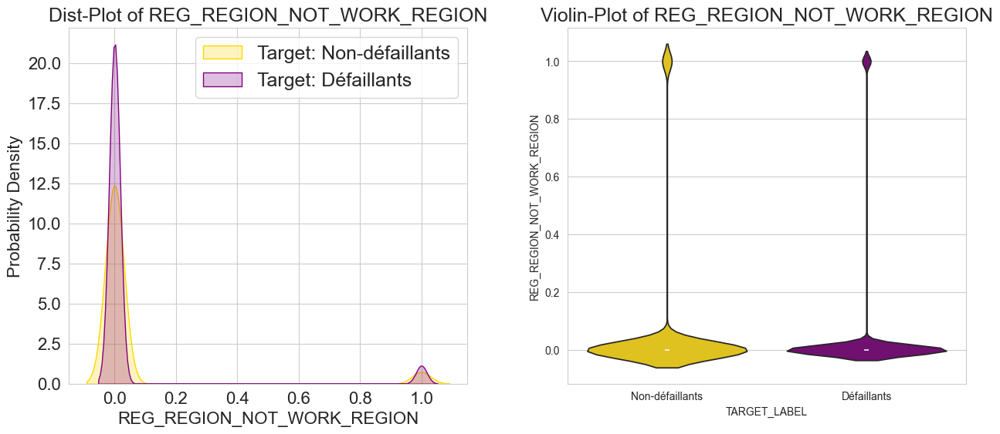

In [29]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'REG_REGION_NOT_WORK_REGION', plots=['distplot', 'violin'], figsize=(15, 6))

- Aucune difference ou incidence sur les catégories

<span style='background:mistyrose'>**Variable LIVE_REGION_NOT_WORK_REGION**</span>

- Variable binaire (0,1) sur la non-attribution ou non de l'adresse professionnelle du demandeur à celui de l'adresse de contact  

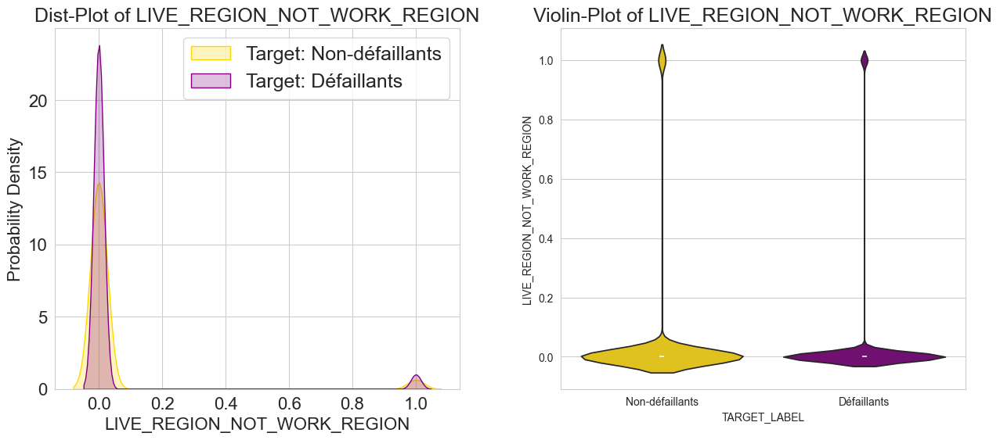

In [30]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'LIVE_REGION_NOT_WORK_REGION', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable  APARTMENTS_AVG**</span>

- Taille moyenne de l'appartement du demandeur

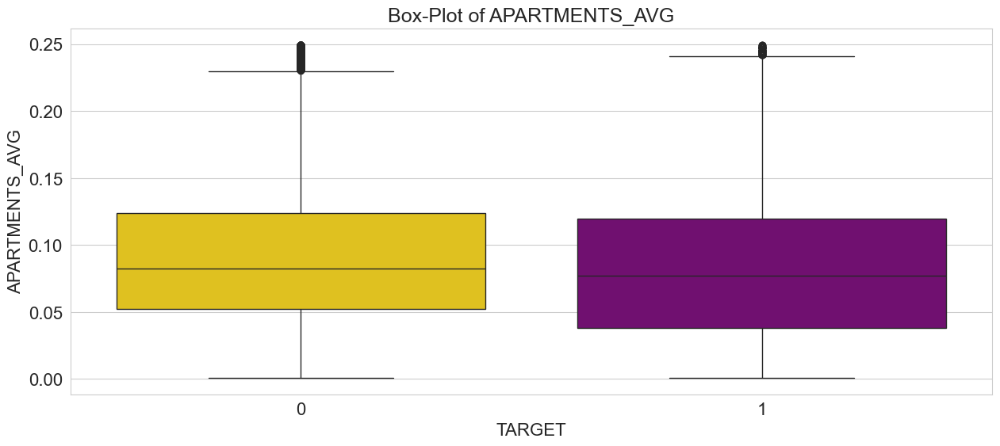

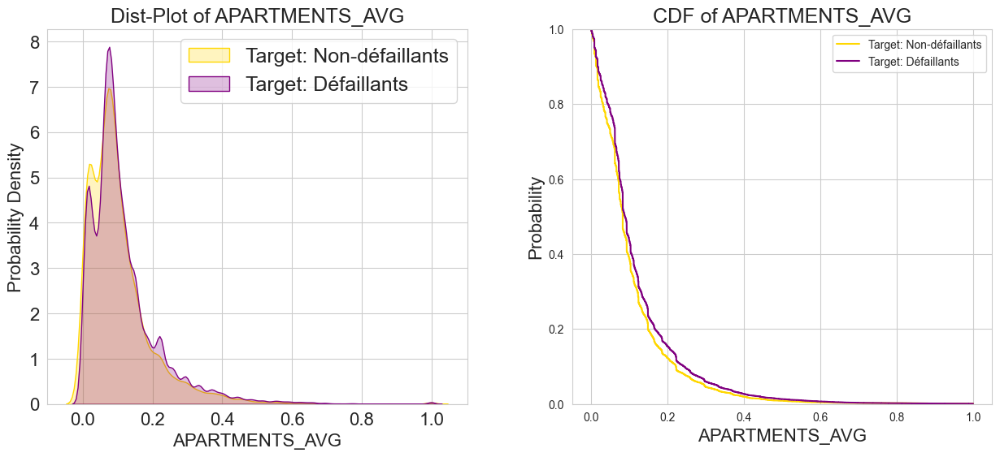

In [31]:
# Affiche boxplot, et displot
fonctions_data.plot_continuous_variables(application_train, 'APARTMENTS_AVG', plots=['box'], figsize=(15, 6), scale_limits=[0, 0.25])
fonctions_data.plot_continuous_variables(application_train, 'APARTMENTS_AVG', plots=['distplot', 'CDF'], figsize=(15, 6))

- La taille moyenne des appartements des défaillants est généralement inférieure à celle des non-défaillants.
- Les défaillants vivent dans des appartements de taille moyenne plus petite que les non-défaillants

<span style='background:mistyrose'>**Variable APARTMENTS_MEDI**</span>

- Immeuble où vit le demandeur du mode de l'appartement.

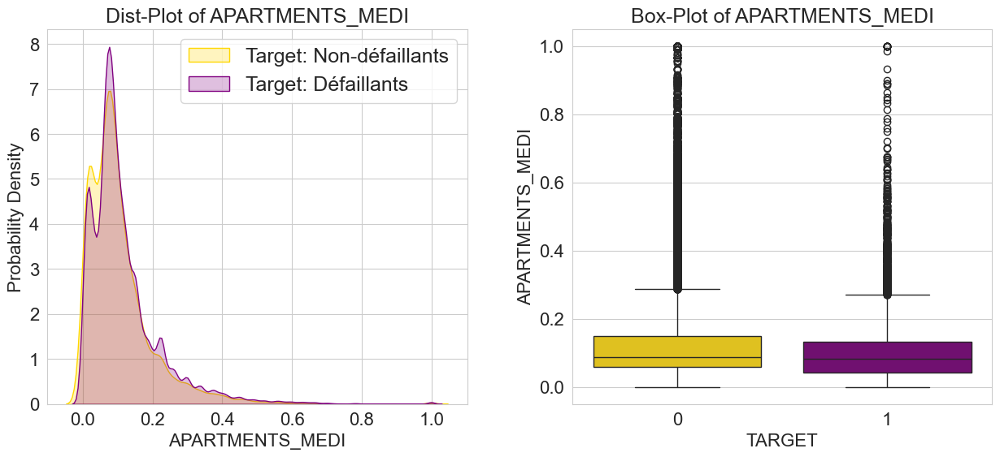

In [32]:
fonctions_data.plot_continuous_variables(application_train, 'APARTMENTS_MEDI', plots=['distplot', 'box'], figsize=(15, 6))

- Un mode d'apartement légèrement inférieur pour les défaillants par raport aux non-défaillants.

<span style='background:mistyrose'>**Variable BASEMENTAREA_AVG**</span>

- Immeuble où vit le demandeur de la taille moyenne de la surface habitable.

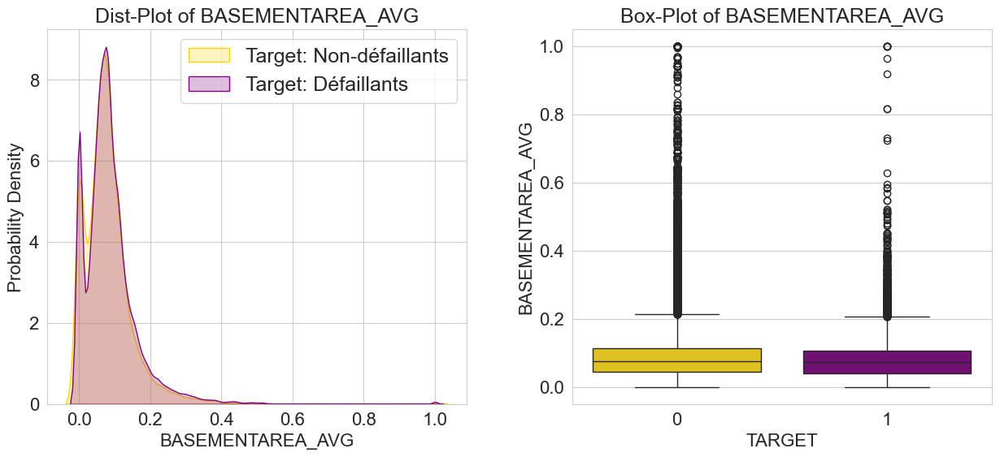

In [33]:
fonctions_data.plot_continuous_variables(application_train, 'BASEMENTAREA_AVG', plots=['distplot', 'box'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable BASEMENTAREA_MEDI**</span>

- Immeuble où vit le demandeur de la médiane de la surface du bâtiment.

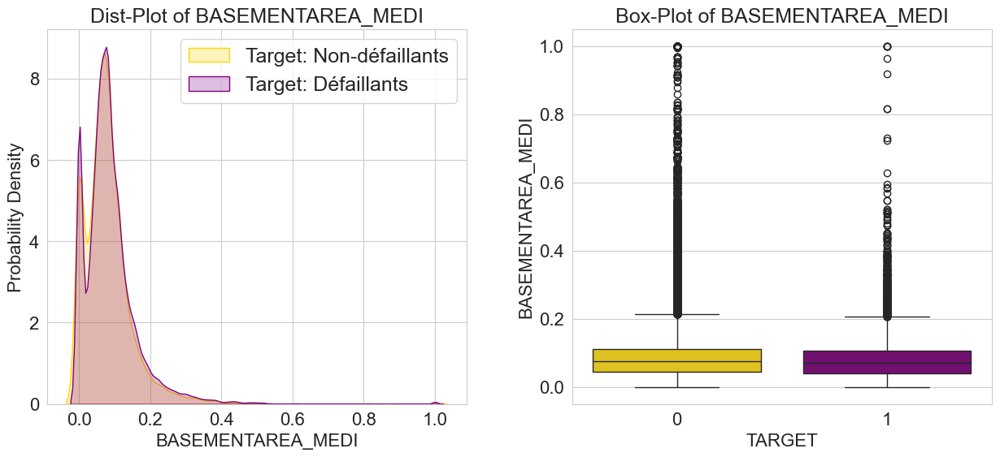

In [34]:
fonctions_data.plot_continuous_variables(application_train, 'BASEMENTAREA_MEDI', plots=['distplot', 'box'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable  BASEMENTAREA_MODE**</span>

- Immeuble où vit le demandeur du mode de la surface du bâtiment.

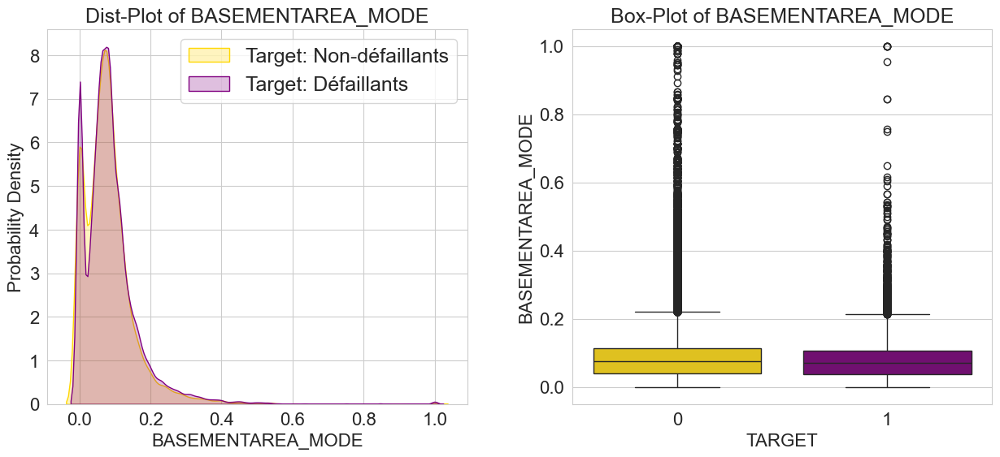

In [35]:
fonctions_data.plot_continuous_variables(application_train, 'BASEMENTAREA_MODE', plots=['distplot', 'box'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable  YEARS_BEGINEXPLUATATION_AVG**</span>

- Immeuble où vit le demandeur de l'âge moyen de début d'exploitation de l'immeuble.

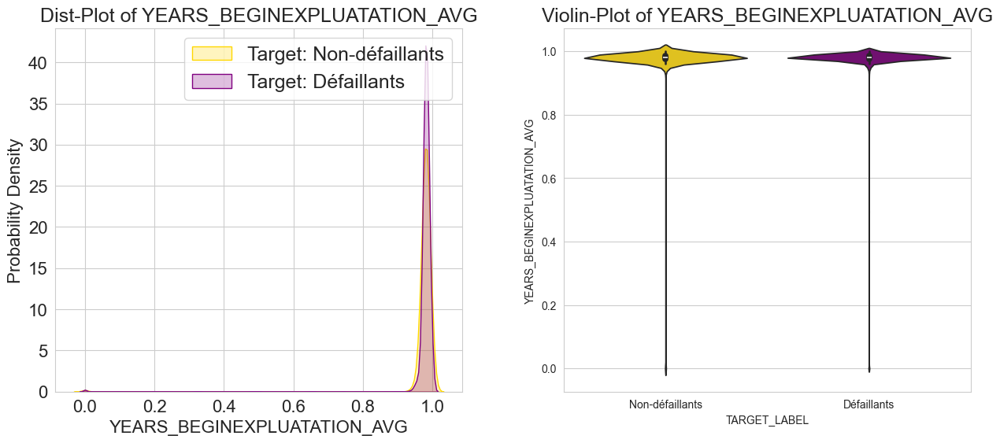

In [36]:
fonctions_data.plot_continuous_variables(application_train, 'YEARS_BEGINEXPLUATATION_AVG', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable  YEARS_BEGINEXPLUATATION_MODE**</span>

- Immeuble où vit le demandeur du mode de l'âge de début d'exploitation de l'immeuble.

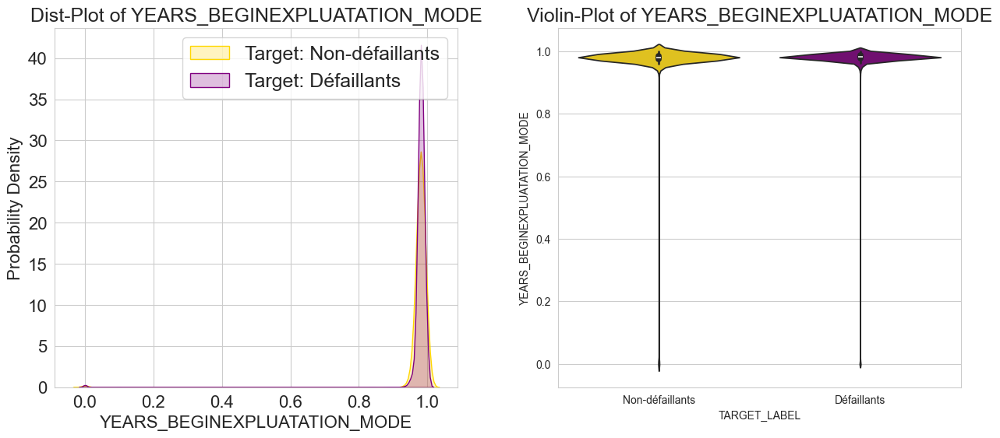

In [37]:
fonctions_data.plot_continuous_variables(application_train, 'YEARS_BEGINEXPLUATATION_MODE', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable YEARS_BEGINEXPLUATATION_MEDI**</span>

- Immeuble où vit le demandeur de la médiane de l'âge de début d'exploitation de l'immeuble.

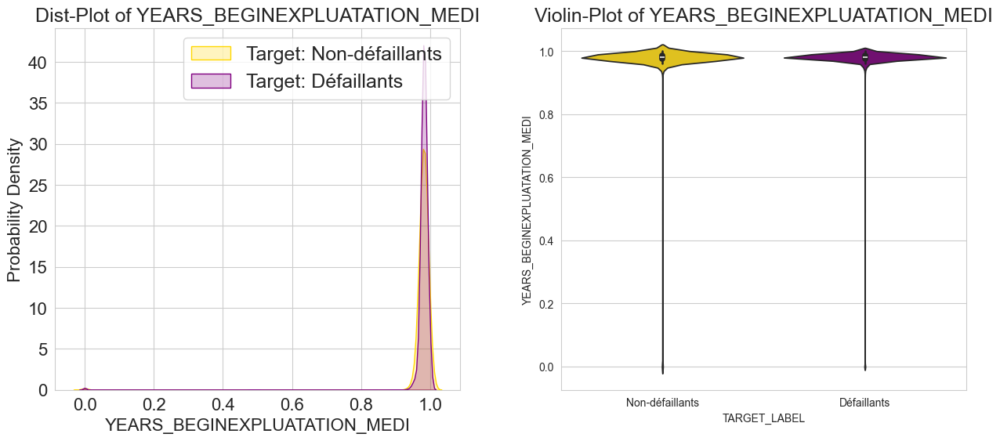

In [38]:
fonctions_data.plot_continuous_variables(application_train, 'YEARS_BEGINEXPLUATATION_MEDI', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable YEARS_BUILD_AVG**</span>

- Immeuble où vit le demandeur de l'âge moyen de l'immeuble.

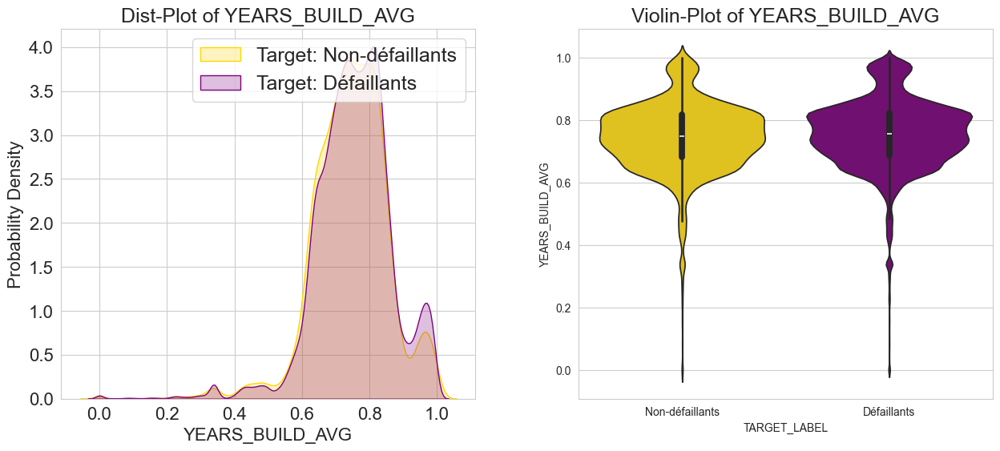

In [39]:
fonctions_data.plot_continuous_variables(application_train, 'YEARS_BUILD_AVG', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable YEARS_BUILD_MODE**</span>

- Immeuble où vit le demandeur de la médiane de l'âge de l'immeuble.

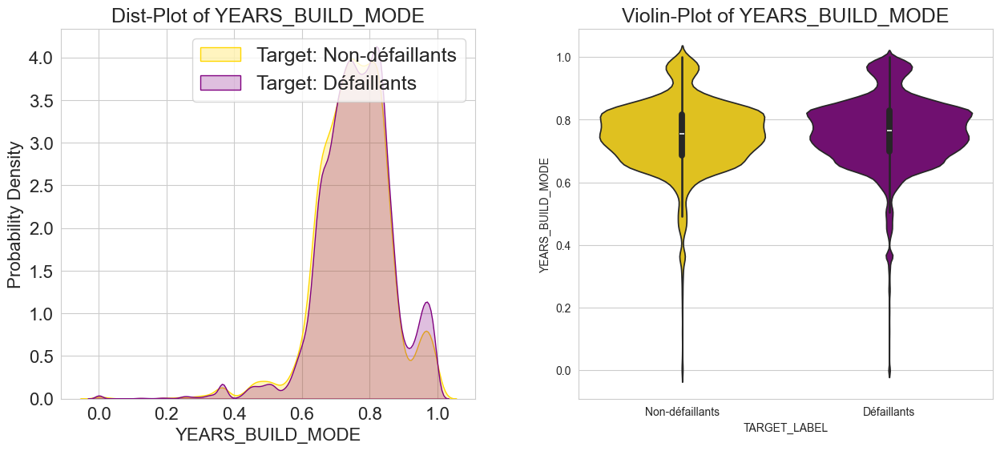

In [40]:
fonctions_data.plot_continuous_variables(application_train, 'YEARS_BUILD_MODE', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable YEARS_BUILD_MEDI**</span>

- Immeuble où vit le demandeur du mode de l'âge de l'immeuble.

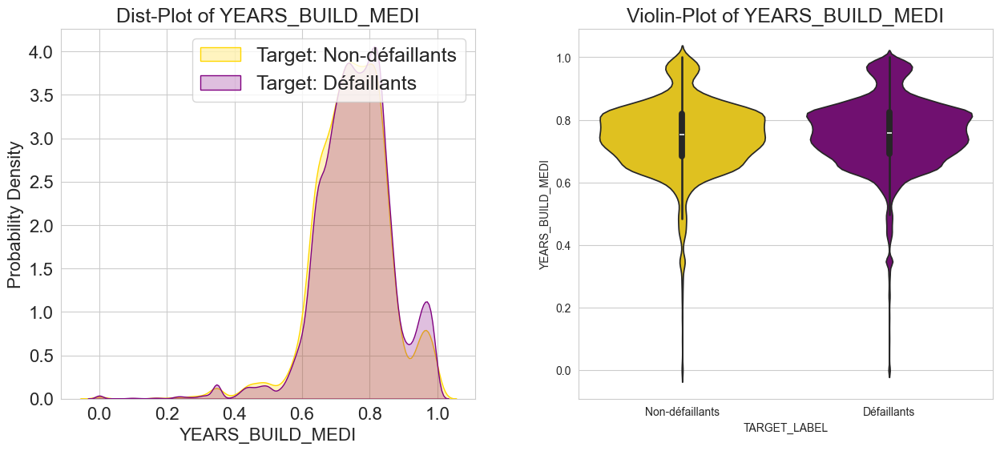

In [41]:
fonctions_data.plot_continuous_variables(application_train, 'YEARS_BUILD_MEDI', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable COMMONAREA_AVG**</span>

- Immeuble où vit le demandeur de la taille moyenne de la surface commune.

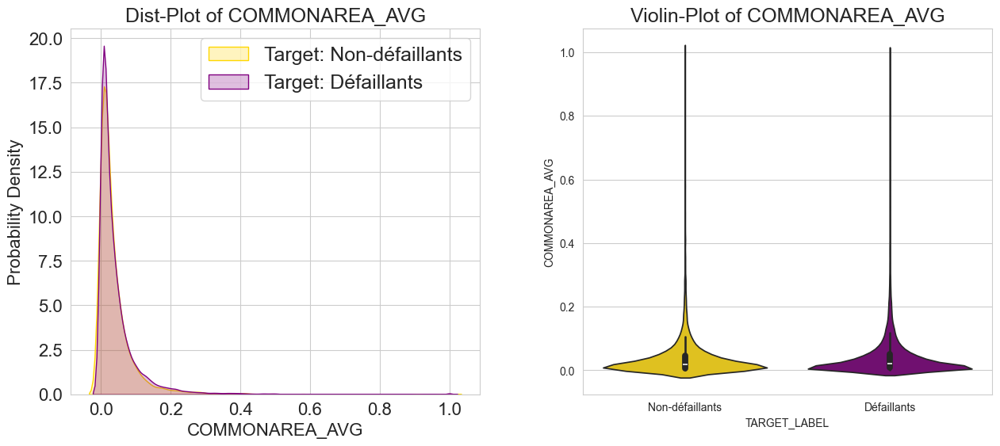

In [42]:
fonctions_data.plot_continuous_variables(application_train, 'COMMONAREA_AVG', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable COMMONAREA_MEDI**</span>

- Immeuble où vit le demandeur de la médiane de la surface commune.

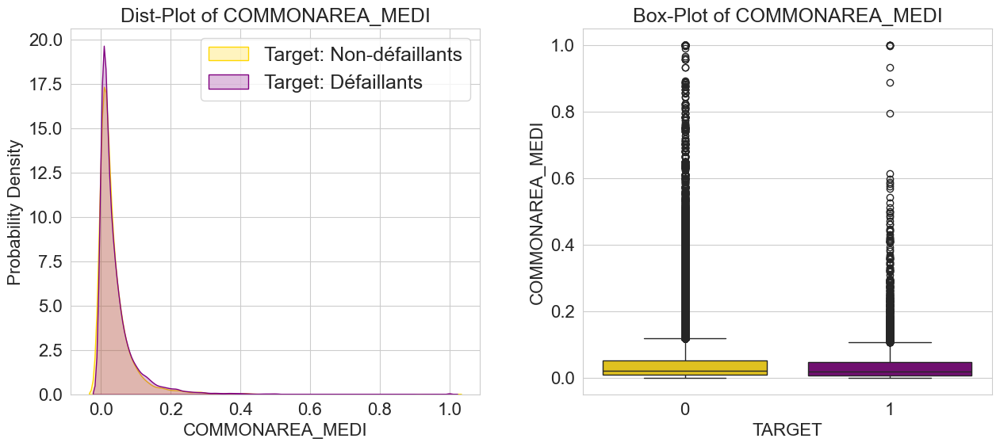

In [43]:
fonctions_data.plot_continuous_variables(application_train, 'COMMONAREA_MEDI', plots=['distplot', 'box'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable COMMONAREA_MODE**</span>

- Immeuble où vit le demandeur du mode de la surface commune.

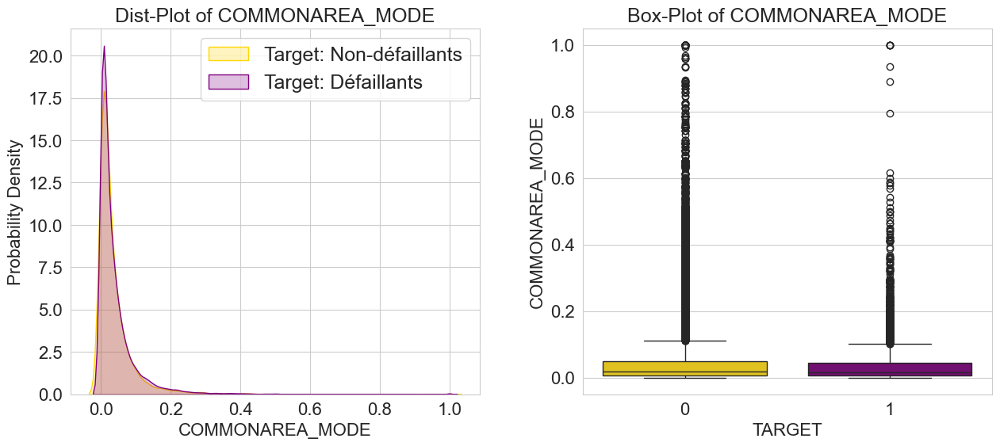

In [44]:
fonctions_data.plot_continuous_variables(application_train, 'COMMONAREA_MODE', plots=['distplot', 'box'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable  ELEVATORS_AVG**</span>

- Immeuble où vit le demandeur du nombre d'étages moyens.

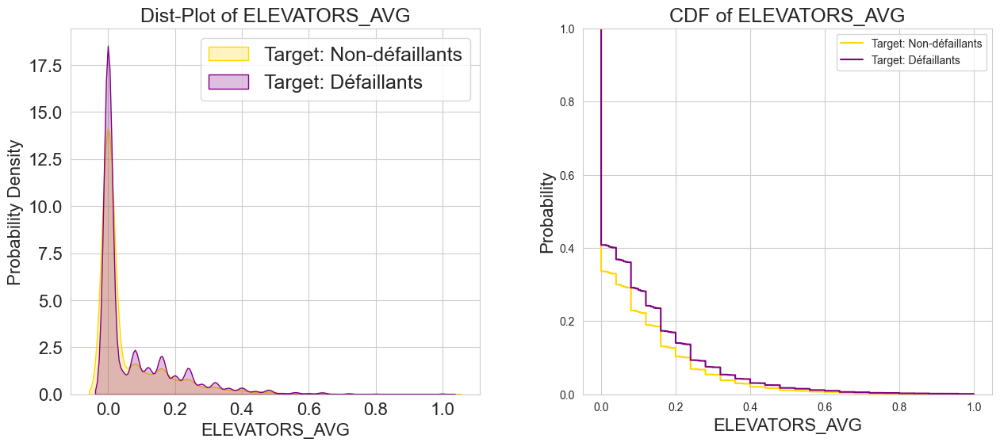

In [45]:
fonctions_data.plot_continuous_variables(application_train, 'ELEVATORS_AVG', plots=['distplot', 'CDF'], figsize=(15, 6))

- Les non-défaillants globalement habitent dans des habitations de type rez-de-chaussée (sans étage), contrairement aux défaillants.

<span style='background:mistyrose'>**Variable ELEVATORS_MODE**</span>

- Immeuble où vit le demandeur du mode du nombre d'étages.

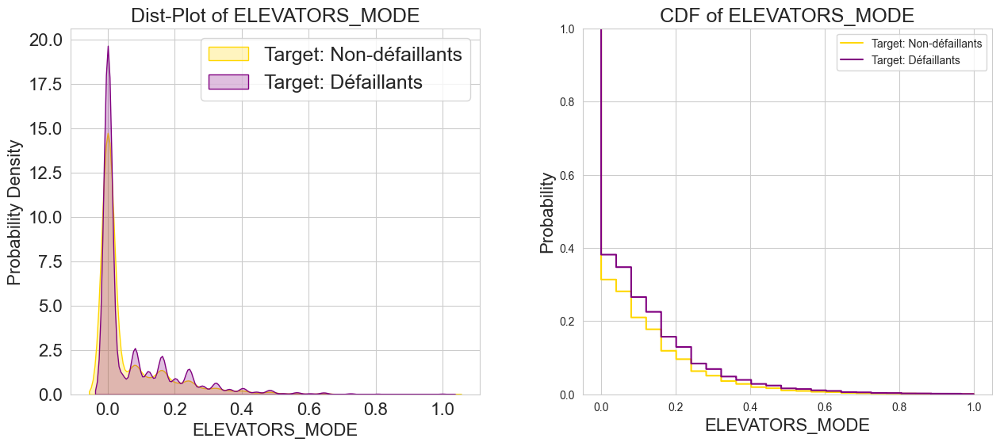

In [46]:
fonctions_data.plot_continuous_variables(application_train, 'ELEVATORS_MODE', plots=['distplot', 'CDF'], figsize=(15, 6))

- Les demandeurs défaillants habitent des maisons ou appartements avec plus d'étages que les non-défaillants, mais cet écart est faible.

<span style='background:mistyrose'>**Variable ELEVATORS_MEDI**</span>

- Immeuble où vit le demandeur de la médiane du nombre d'étages.

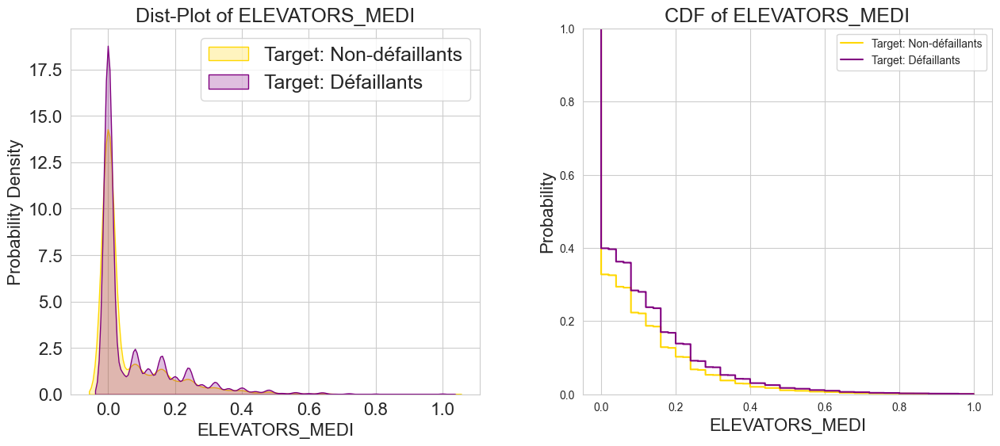

In [47]:
fonctions_data.plot_continuous_variables(application_train, 'ELEVATORS_MEDI', plots=['distplot', 'CDF'], figsize=(15, 6))

- Les non-défaillants globalement habitent dans des habitations de type rez-de-chaussée (sans étage), contrairement aux défaillants.

<span style='background:mistyrose'>**Variable ENTRANCES_AVG**</span>

- Immeuble où vit le demandeur de la moyenne du nombre d'entrées.

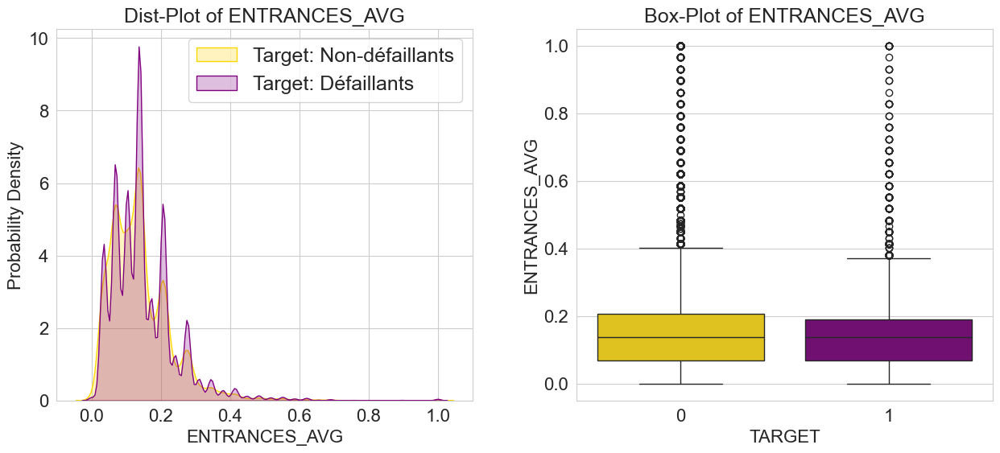

In [48]:
fonctions_data.plot_continuous_variables(application_train, 'ENTRANCES_AVG', plots=['distplot', 'box'], figsize=(15, 6))

- Les non-défaillants ont une moyenne du nombre d'entrées légèrement supérieure aux défaillants.

<span style='background:mistyrose'>**Variable ENTRANCES_MODE**</span>

- Immeuble où vit le demandeur du mode du nombre d'entrées.

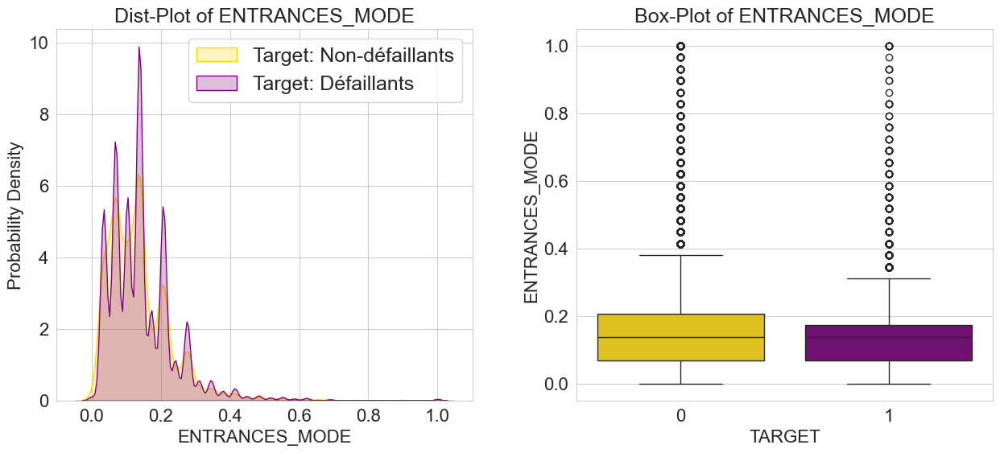

In [49]:
fonctions_data.plot_continuous_variables(application_train, 'ENTRANCES_MODE', plots=['distplot', 'box'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable ENTRANCES_MEDI**</span>

- Immeuble où vit le demandeur de la médiane du nombre d'entrées.

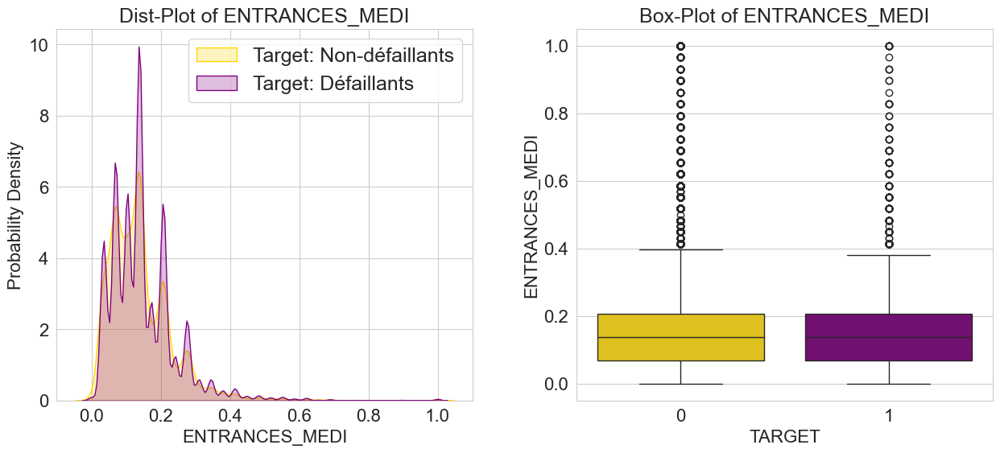

In [50]:
fonctions_data.plot_continuous_variables(application_train, 'ENTRANCES_MEDI', plots=['distplot', 'box'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable  LANDAREA_AVG**</span>

- Immeuble où vit le demandeur de la taille moyenne de la surface du terrain.

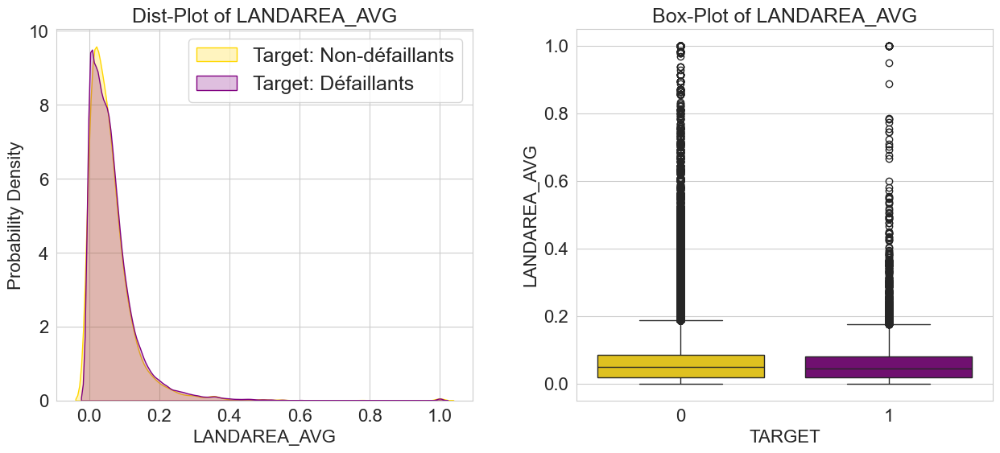

In [51]:
fonctions_data.plot_continuous_variables(application_train, 'LANDAREA_AVG', plots=['distplot', 'box'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable  LANDAREA_MEDI**</span>

- Immeuble où vit le demandeur de la médiane de la surface du terrain..

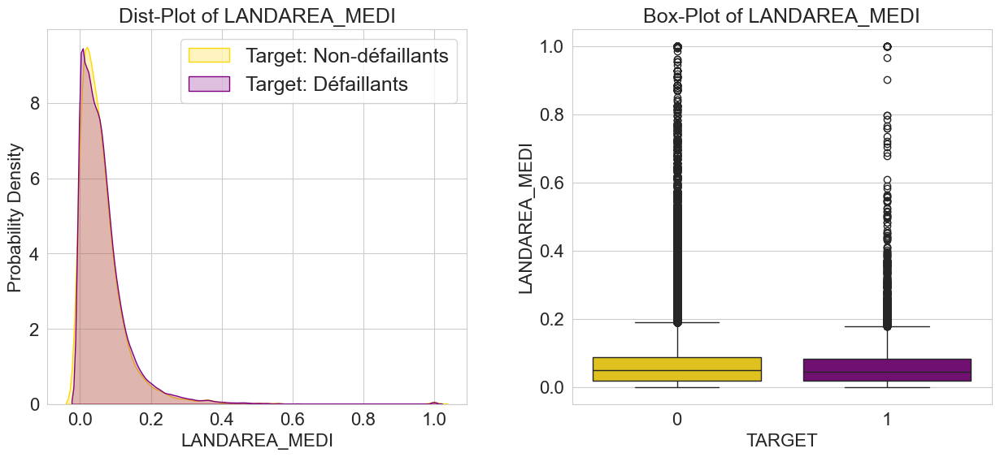

In [52]:
fonctions_data.plot_continuous_variables(application_train, 'LANDAREA_MEDI', plots=['distplot', 'box'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable LANDAREA_MODE**</span>

- Immeuble où vit le demandeur du mode de la surface du terrain.

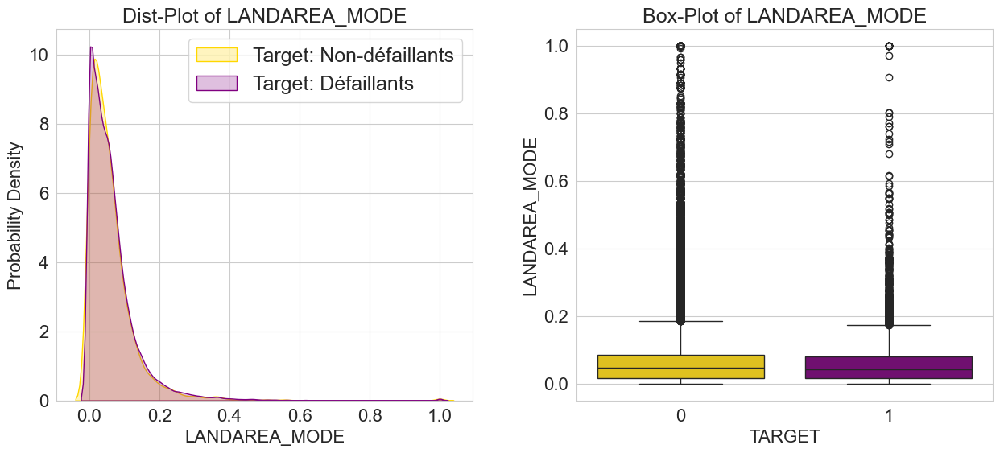

In [53]:
fonctions_data.plot_continuous_variables(application_train, 'LANDAREA_MODE', plots=['distplot', 'box'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable LIVINGAPARTMENTS_AVG**</span>

- Immeuble où vit le demandeur de la taille moyenne de l'appartement.

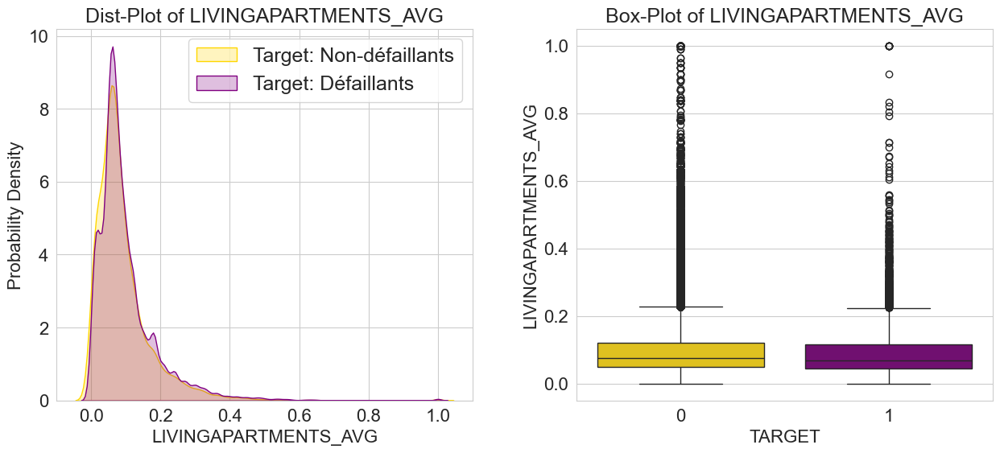

In [54]:
fonctions_data.plot_continuous_variables(application_train, 'LIVINGAPARTMENTS_AVG', plots=['distplot', 'box'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable  LIVINGAPARTMENTS_MODE**</span>

- Immeuble où vit le demandeur du mode de l'appartement.

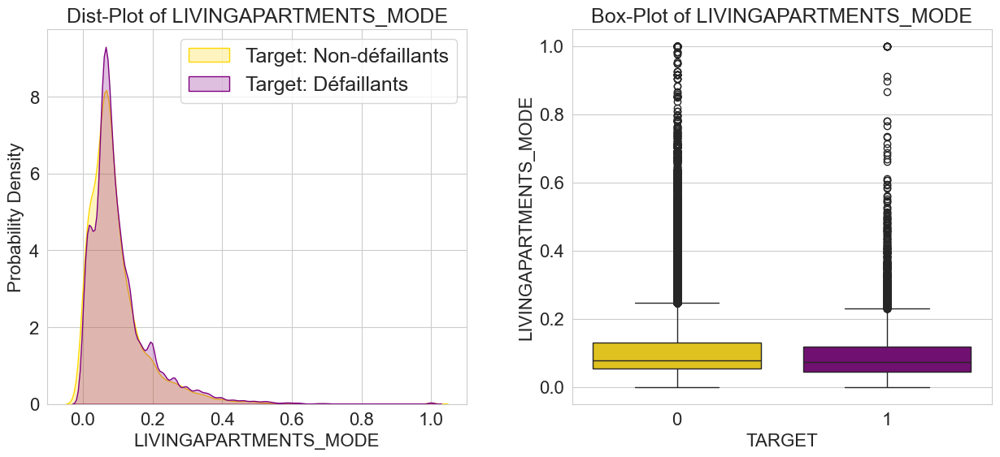

In [55]:
fonctions_data.plot_continuous_variables(application_train, 'LIVINGAPARTMENTS_MODE', plots=['distplot', 'box'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable LIVINGAPARTMENTS_MEDI**</span>

- Immeuble où vit le demandeur de la médiane de l'appartement.

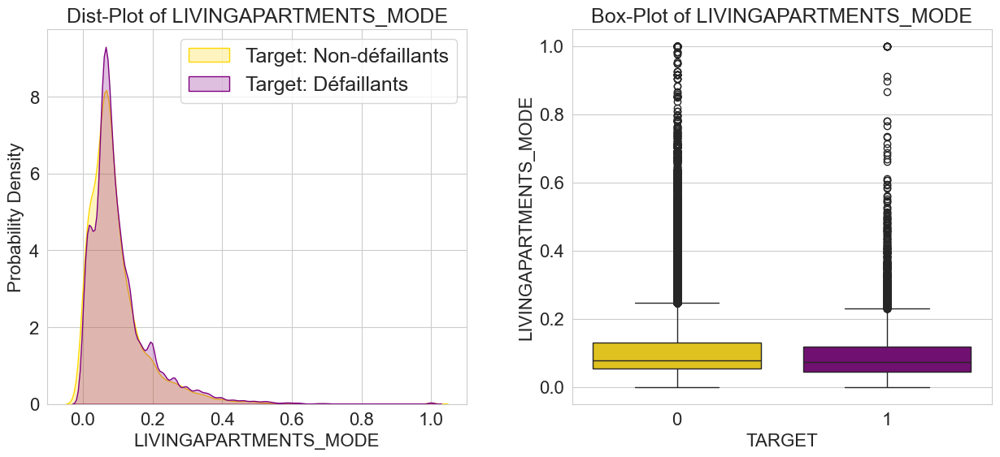

In [56]:
fonctions_data.plot_continuous_variables(application_train, 'LIVINGAPARTMENTS_MODE', plots=['distplot', 'box'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable LIVINGAREA_AVG**</span>

- Immeuble où vit le demandeur de la taille moyenne de la surface habitable de l'appartement.

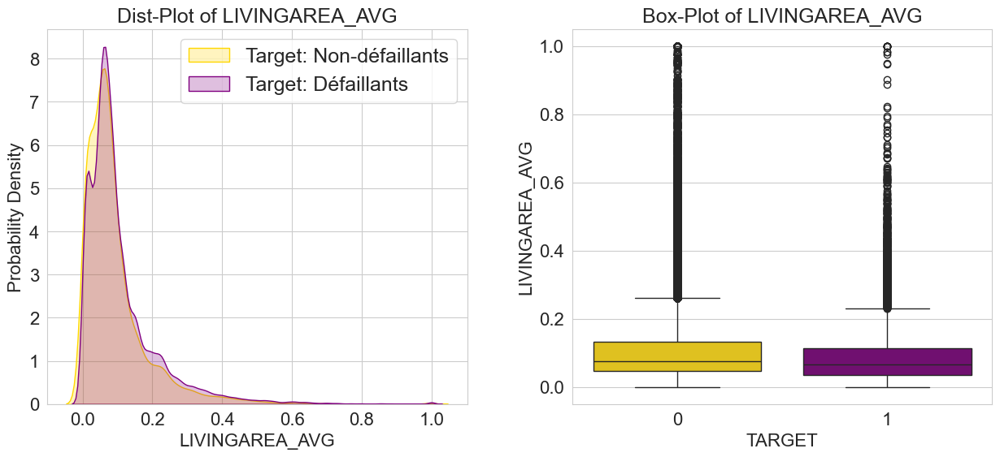

In [57]:
fonctions_data.plot_continuous_variables(application_train, 'LIVINGAREA_AVG', plots=['distplot', 'box'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable LIVINGAREA_MEDI**</span>

- Immeuble où vit le demandeur de la médiane de la surface habitable de l'appartement.

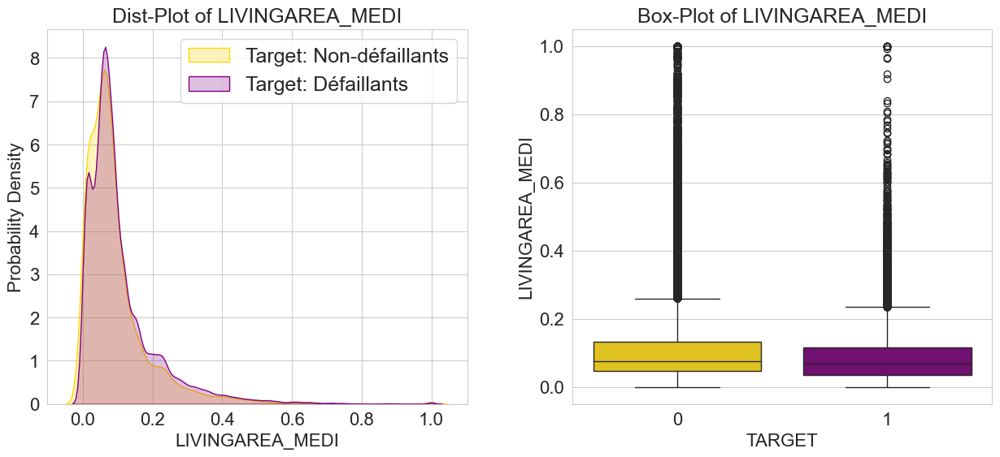

In [58]:
fonctions_data.plot_continuous_variables(application_train, 'LIVINGAREA_MEDI', plots=['distplot', 'box'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable LIVINGAREA_MODE**</span>

- Immeuble où vit le demandeur du mode de la surface habitable de l'appartement.

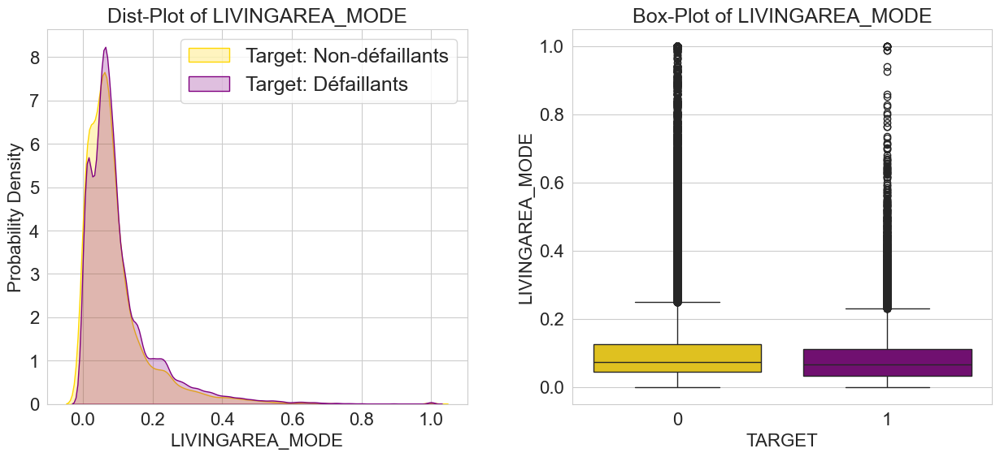

In [59]:
fonctions_data.plot_continuous_variables(application_train, 'LIVINGAREA_MODE', plots=['distplot', 'box'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable  NONLIVINGAPARTMENTS_AVG**</span>

- Immeuble où vit le demandeur de la taille moyenne de la surface commune de l'appartement.

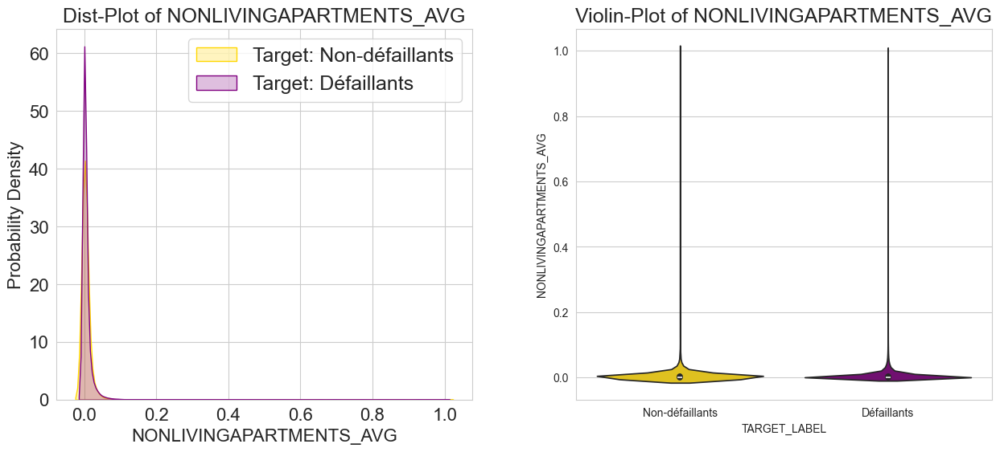

In [60]:
fonctions_data.plot_continuous_variables(application_train, 'NONLIVINGAPARTMENTS_AVG', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable NONLIVINGAPARTMENTS_MODE**</span>

- Immeuble où vit le demandeur du mode de la surface commune de l'appartement.

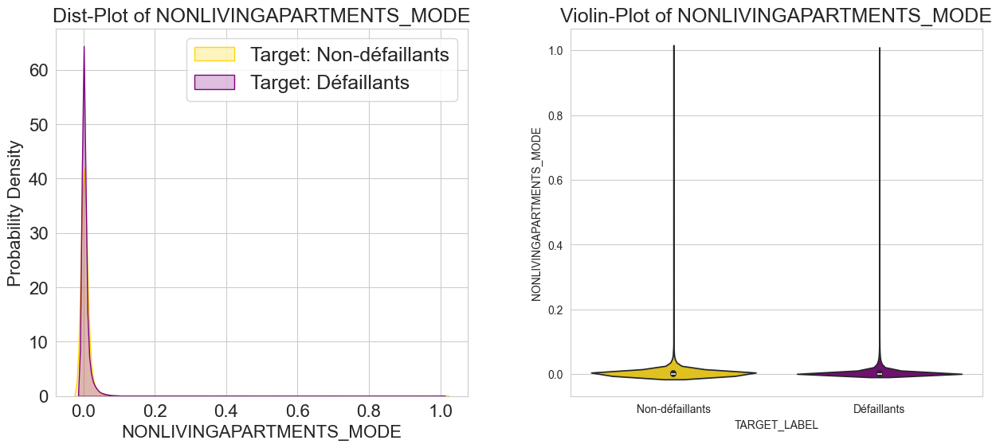

In [61]:
fonctions_data.plot_continuous_variables(application_train, 'NONLIVINGAPARTMENTS_MODE', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable NONLIVINGAPARTMENTS_MEDI**</span>

- Immeuble où vit le demandeur de la médiane de la surface commune de l'appartement.

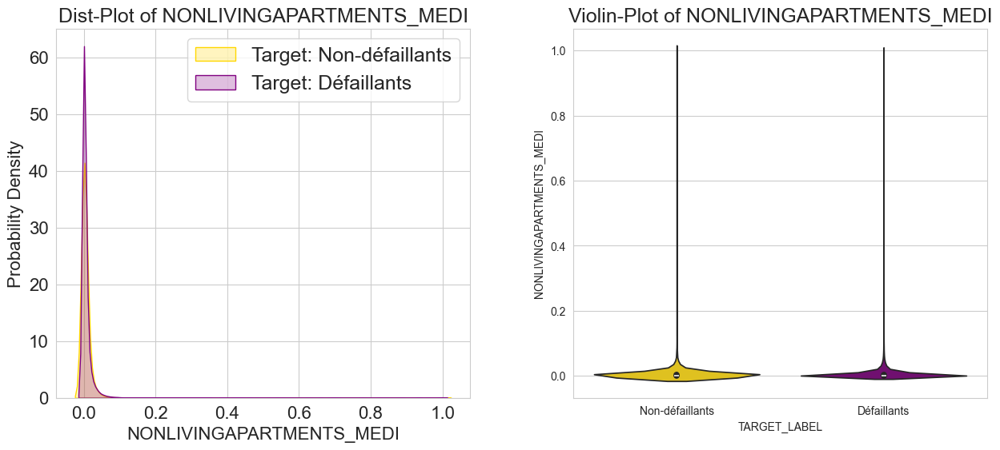

In [62]:
fonctions_data.plot_continuous_variables(application_train, 'NONLIVINGAPARTMENTS_MEDI', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable NONLIVINGAREA_AVG**</span>

- Immeuble où vit le demandeur de la moyenne de la surface habitable de l'appartement


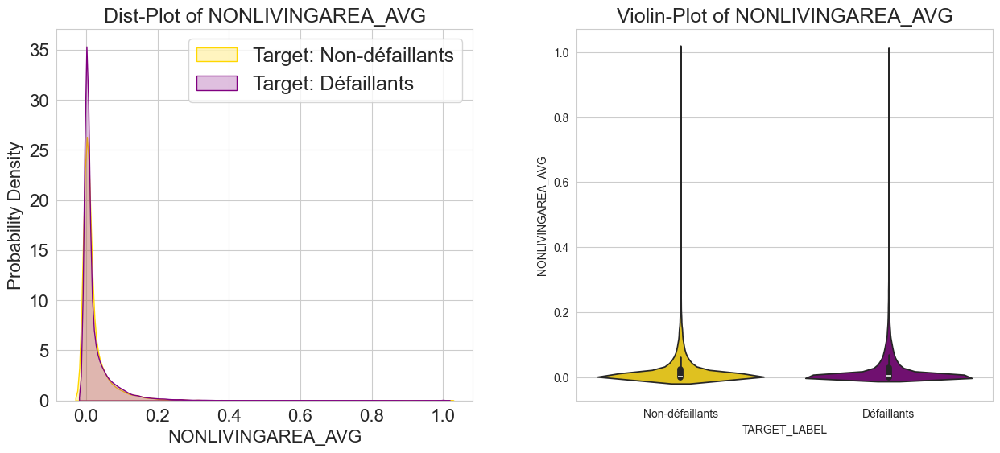

In [63]:
fonctions_data.plot_continuous_variables(application_train, 'NONLIVINGAREA_AVG', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable NONLIVINGAREA_MODE**</span>

- Immeuble où vit le demandeur du mode de la surface habitable de l'appartement.

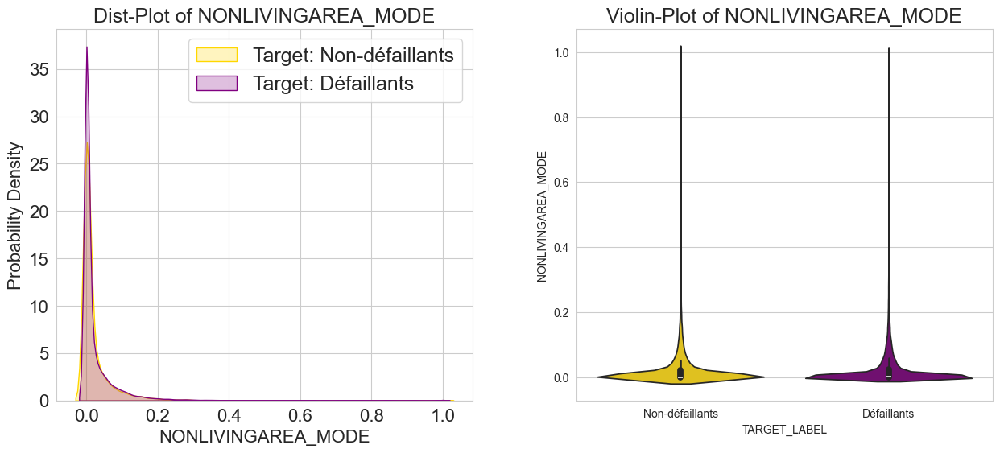

In [64]:
fonctions_data.plot_continuous_variables(application_train, 'NONLIVINGAREA_MODE', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable NONLIVINGAREA_MEDI**</span>

- Immeuble où vit le demandeur de la médiane de la surface habitable de l'appartement.

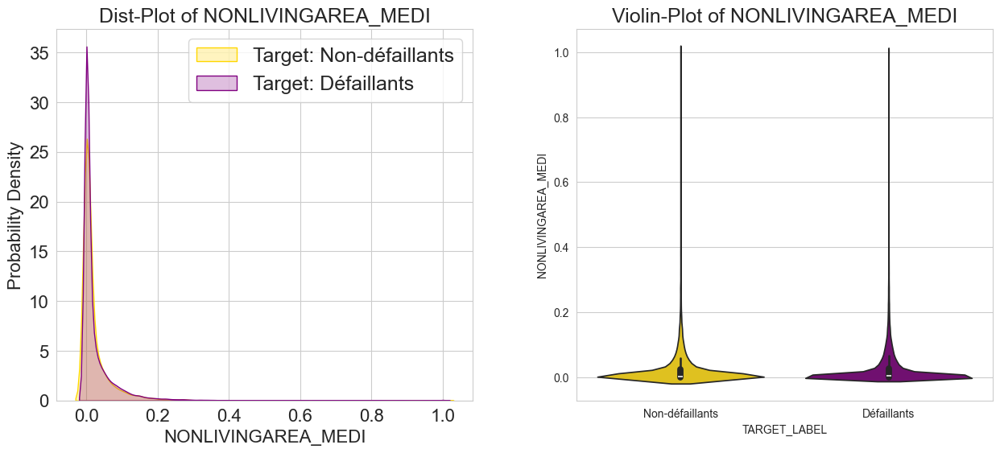

In [65]:
fonctions_data.plot_continuous_variables(application_train, 'NONLIVINGAREA_MEDI', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable  TOTALAREA_MODE**</span>

- Immeuble où vit le demandeur du mode de la surface totale.

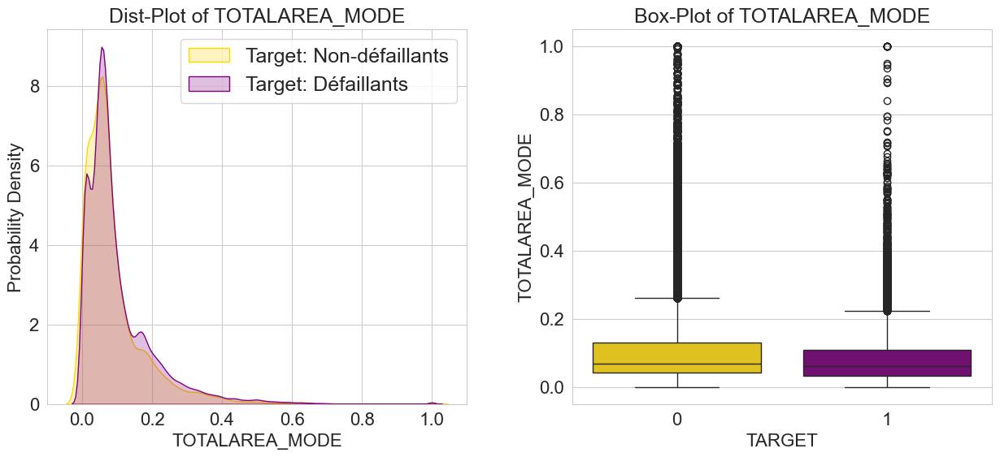

In [66]:
fonctions_data.plot_continuous_variables(application_train, 'TOTALAREA_MODE', plots=['distplot', 'box'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable  OBS_30_CNT_SOCIAL_CIRCLE**</span>

- Nombre d'observations de l'environnement social du demandeurs avec des défauts observables de 30 DPD (jours de retard)

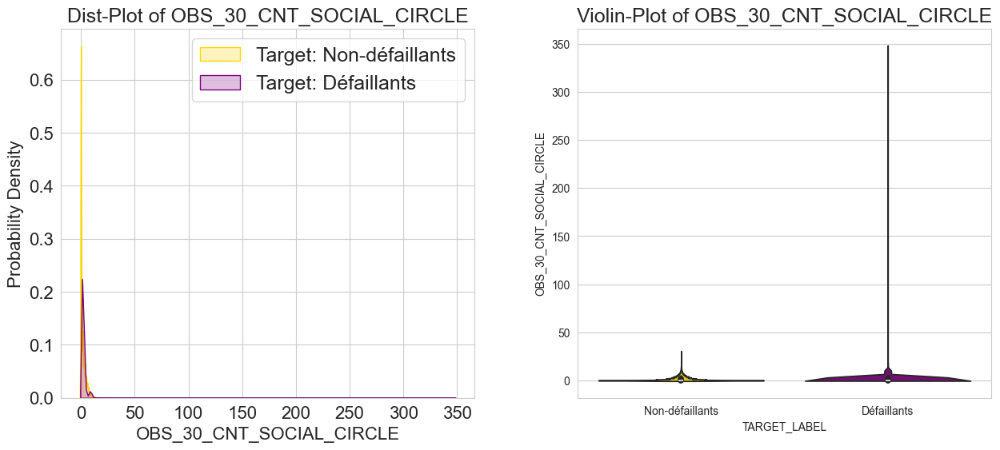

In [67]:
fonctions_data.plot_continuous_variables(application_train, 'OBS_30_CNT_SOCIAL_CIRCLE', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable DEF_30_CNT_SOCIAL_CIRCLE**</span>

- Nombre d'observations de l'environnement social du demandeur ont fait l'objet d'un défaut de paiement à 30 DPD (jours d'arriérés).

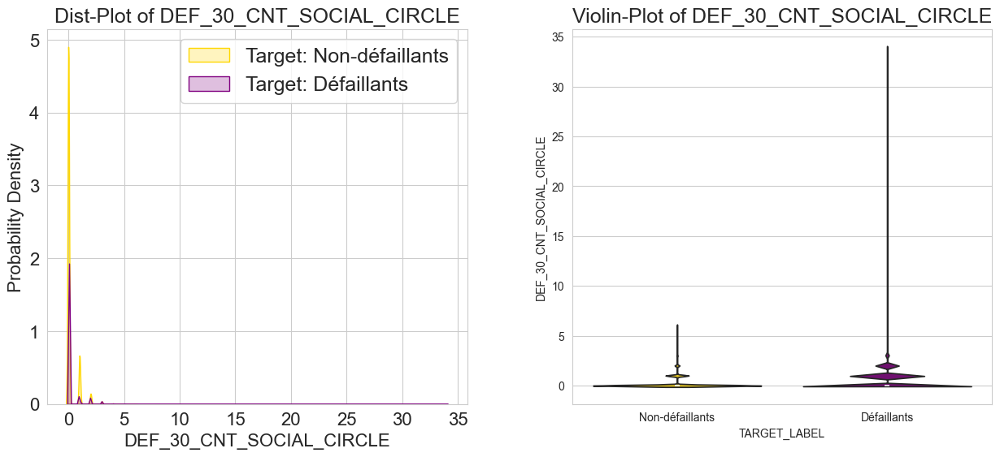

In [68]:
fonctions_data.plot_continuous_variables(application_train, 'DEF_30_CNT_SOCIAL_CIRCLE', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable OBS_60_CNT_SOCIAL_CIRCLE**</span>

- Nombre d'observations de l'environnement social du demandeur avec des défauts observables de 60 DPD (jours de retard).

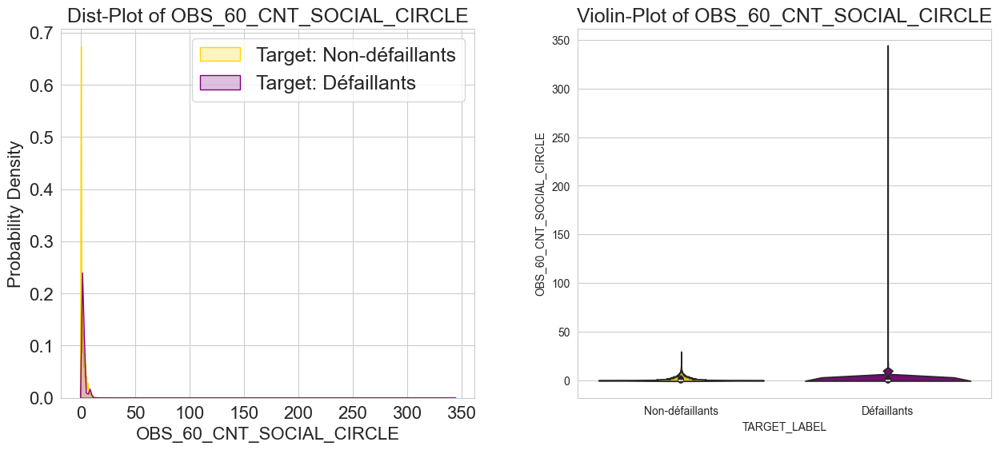

In [69]:
fonctions_data.plot_continuous_variables(application_train, 'OBS_60_CNT_SOCIAL_CIRCLE', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable DEF_60_CNT_SOCIAL_CIRCLE**</span>

- Nombre d'observations de l'environnement social du demandeur ont fait l'objet d'un défaut de paiement de 60 (jours d'arriérés) DPD.

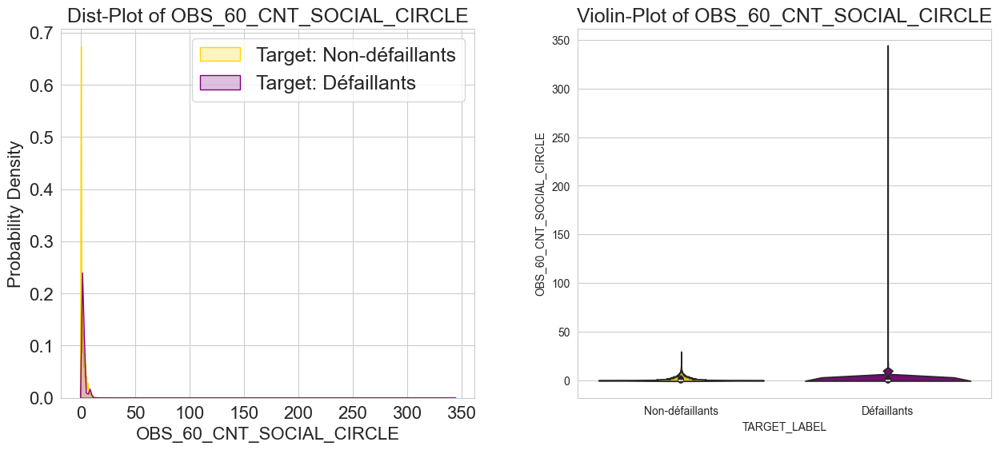

In [70]:
fonctions_data.plot_continuous_variables(application_train, 'OBS_60_CNT_SOCIAL_CIRCLE', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable DAYS_LAST_PHONE_CHANGE**</span>

- Nombre de jours avant la demande le demaneur a-t-il changé de téléphone ?

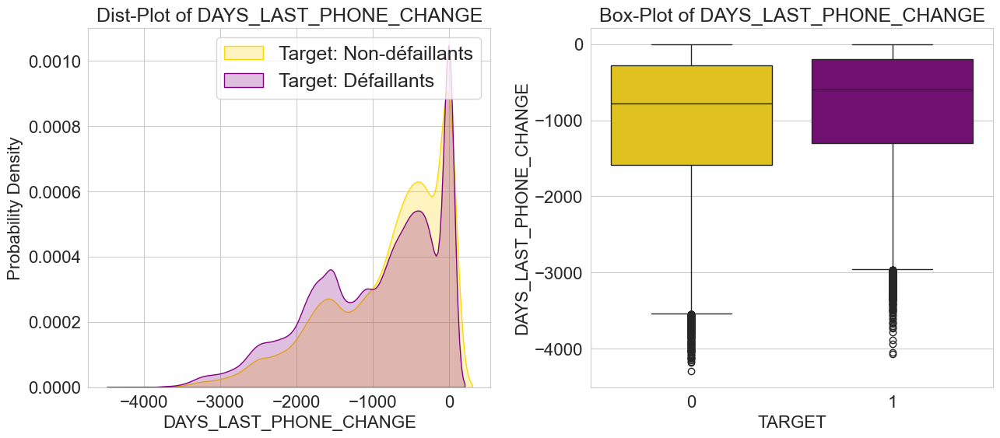

In [71]:
fonctions_data.plot_continuous_variables(application_train, 'DAYS_LAST_PHONE_CHANGE', plots=['distplot', 'box'], figsize=(15, 6))

- On peut voir que les défaillants changent leurs téléphones plus souvent que les non-défaillants.

<span style='background:mistyrose'>**Variable  AMT_REQ_CREDIT_BUREAU_HOUR**</span>

- Nombre de demandes de renseignements sur le demandeurs adressées au Bureau de crédit une heure avant la demande.

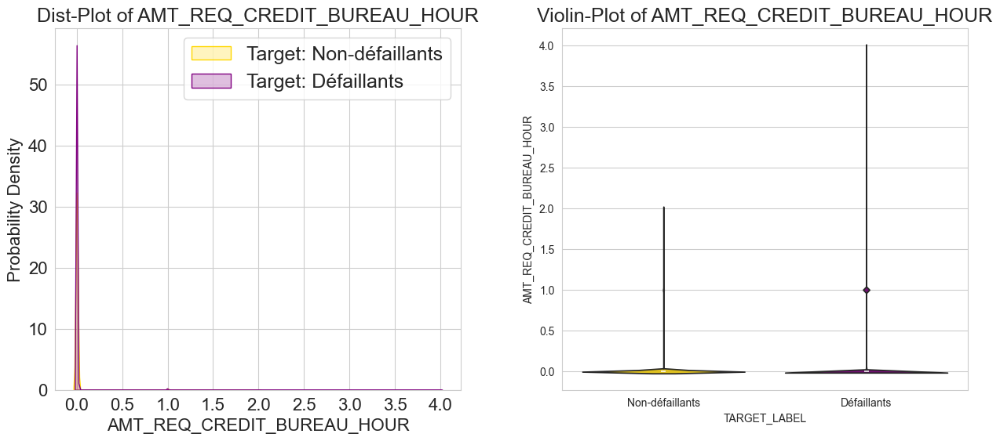

In [72]:
fonctions_data.plot_continuous_variables(application_train, 'AMT_REQ_CREDIT_BUREAU_HOUR', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable  AMT_REQ_CREDIT_BUREAU_DAY**</span>

- Nombre de demandes de renseignements au Bureau de crédit concernant le demandeur un jour avant la demande.

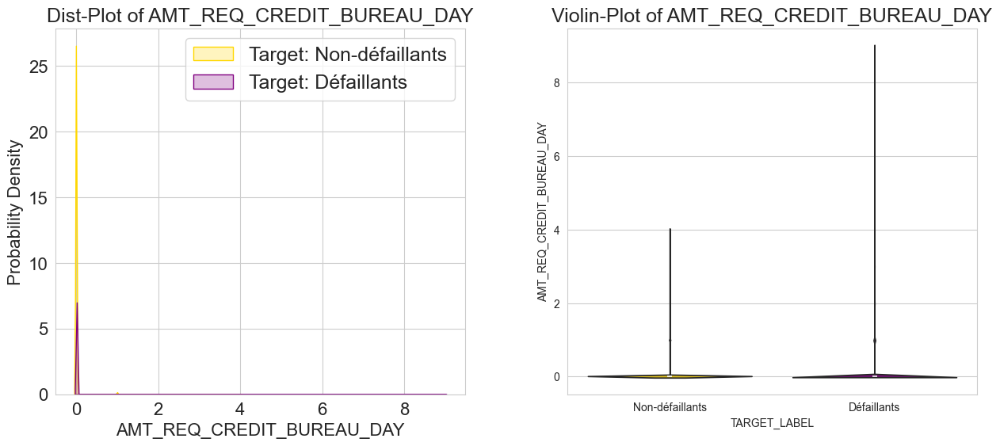

In [73]:
fonctions_data.plot_continuous_variables(application_train, 'AMT_REQ_CREDIT_BUREAU_DAY', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable AMT_REQ_CREDIT_BUREAU_WEEK**</span>

- Nombre de demandes de renseignements au Bureau de crédit concernant le demandeur une semaine avant la demande.

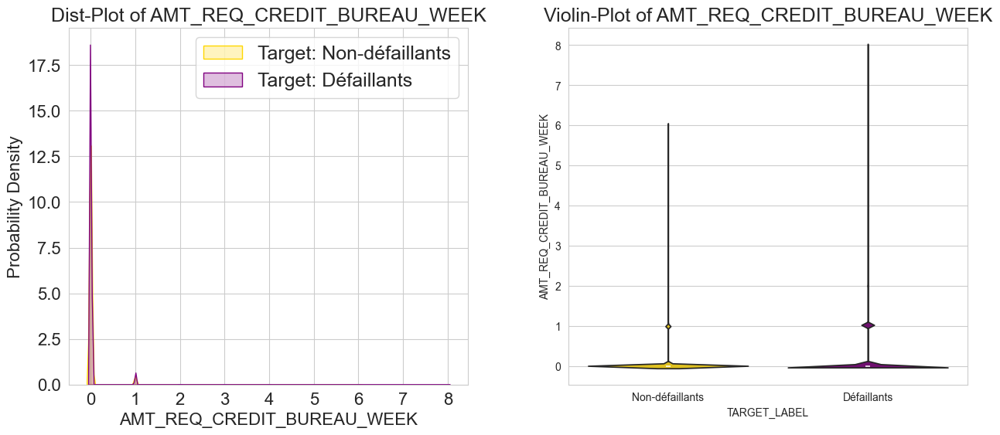

In [74]:
fonctions_data.plot_continuous_variables(application_train, 'AMT_REQ_CREDIT_BUREAU_WEEK', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable AMT_REQ_CREDIT_BUREAU_MON**</span>

- Nombre de demandes de renseignements au Bureau de crédit concernant le demandeur un mois avant la demande.

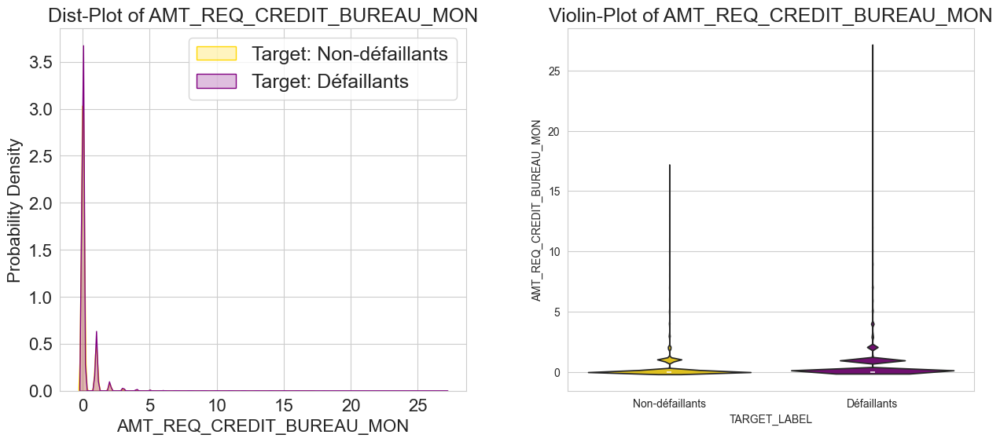

In [75]:
fonctions_data.plot_continuous_variables(application_train, 'AMT_REQ_CREDIT_BUREAU_MON', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable AMT_REQ_CREDIT_BUREAU_QRT**</span>

- Nombre de demandes de renseignements au Bureau de crédit concernant le demandeur 3 mois avant la demande.

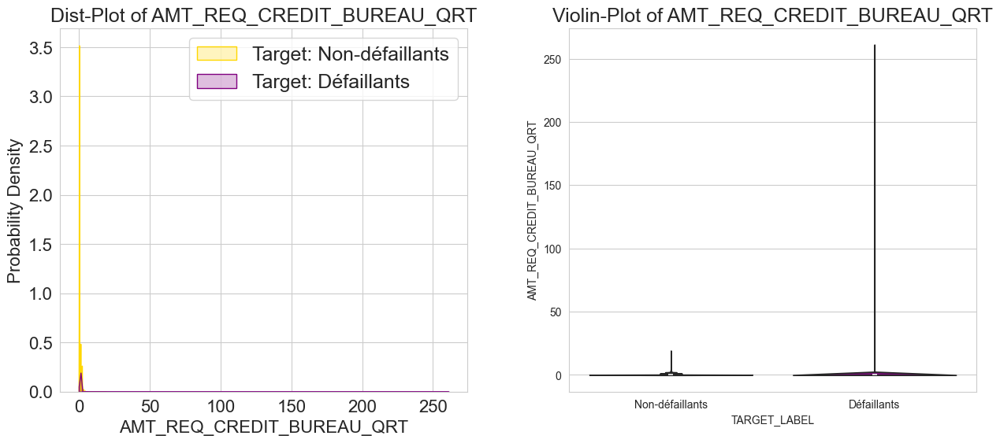

In [76]:
fonctions_data.plot_continuous_variables(application_train, 'AMT_REQ_CREDIT_BUREAU_QRT', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

<span style='background:mistyrose'>**Variable  AMT_REQ_CREDIT_BUREAU_YEAR**</span>

- Nombre de demandes de renseignements au Bureau de crédit concernant le demandeur par jour et par an.

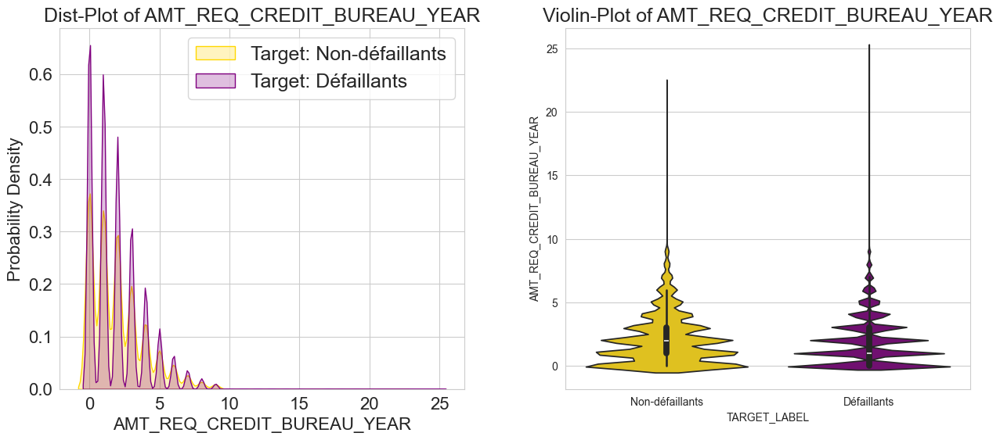

In [77]:
fonctions_data.plot_continuous_variables(application_train, 'AMT_REQ_CREDIT_BUREAU_YEAR', plots=['distplot', 'violin'], figsize=(15, 6))

- Peu de différence entre un défaillant ou un non-défaillant.

#### <span style='background:Moccasin'>2.1.3. Analyse mutlivariée des colonnes</span>

<span style='background:mistyrose'>**Corrélation sur les variables catégorielles**</span>

**Matrice Phi_K**

Phi_K est une constante de corrélation pratique qui fonctionne de manière cohérente entre les variables catégorielles, ordinales et d'intervalle. Il est basé sur plusieurs raffinements du test d'hypothèse de Pearson sur l'indépendance de deux variables.

In [99]:
categorical_columns = ['TARGET', 'FLAG_MOBIL', 'FLAG_EMP_PHONE',
                       'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
                       'FLAG_EMAIL', 'REGION_RATING_CLIENT',
                       'REGION_RATING_CLIENT_W_CITY',
                       'REG_REGION_NOT_LIVE_REGION',
                       'REG_REGION_NOT_WORK_REGION',
                       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
                       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY'] \
    + ['FLAG_DOCUMENT_' + str(i) for i in range(2, 22)] \
    + application_train.dtypes[application_train.dtypes == 'object'] \
    .index.tolist()

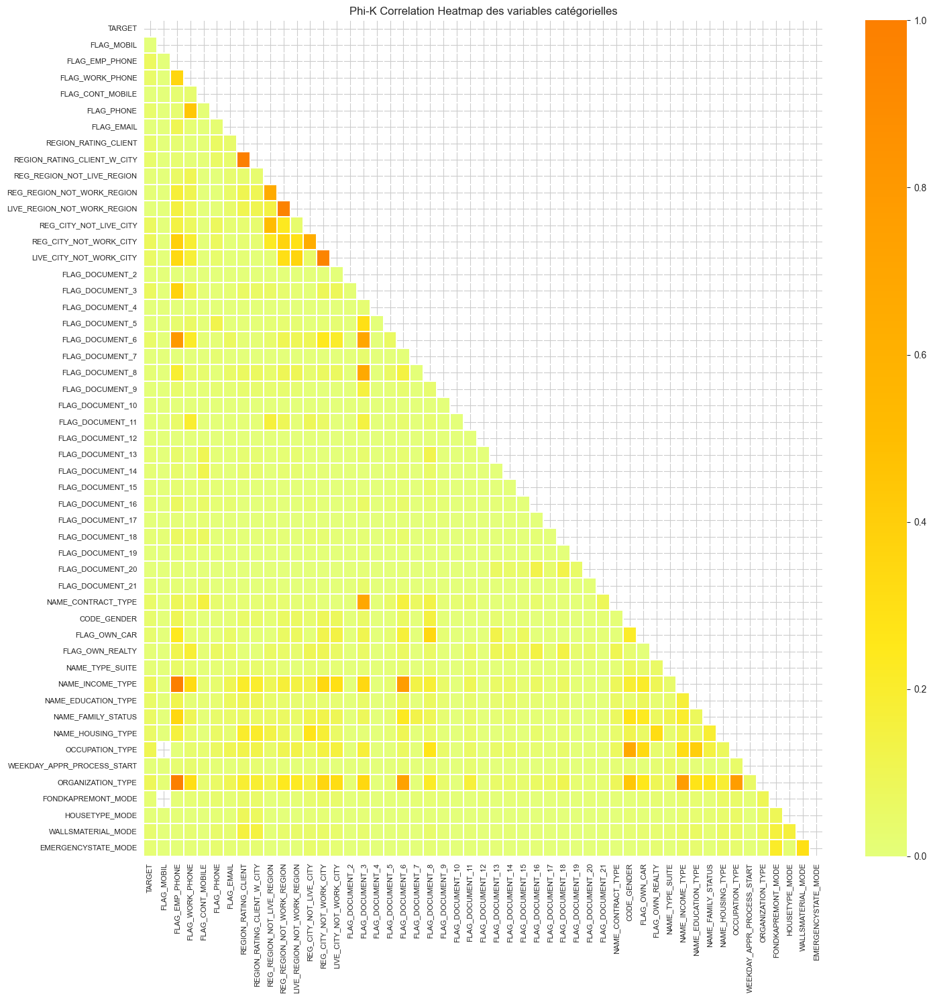

Variable,Phik-Correlation
OCCUPATION_TYPE,0.102846
ORGANIZATION_TYPE,0.089164
NAME_INCOME_TYPE,0.084831
REG_CITY_NOT_WORK_CITY,0.079946
FLAG_EMP_PHONE,0.072087
REG_CITY_NOT_LIVE_CITY,0.069588
FLAG_DOCUMENT_3,0.069525
NAME_FAMILY_STATUS,0.056043
NAME_HOUSING_TYPE,0.051107
LIVE_CITY_NOT_WORK_CITY,0.050956


In [107]:
import phik
from phik import resources, report

fonctions_data.plot_phik_matrix(application_train, categorical_columns, figsize=(15, 15), fontsize=8, cmap='Wistia')

**Bilan** :
***
- La carte thermique de la corrélation Phi-K ci-dessus montre que globalement l'ensemble des variables catégorielles ne sont pas corrélées entre elles, mais que certaines d'entre elles présentent une forte corrélation.
- Certaines des paires de catégories fortement corrélées sont :
    - REGION_RATING_CLIENT_W_CITY et REGION_RATING_CLIENT - Ceci est compréhensible car elles racontent plus ou moins une histoire similaire.
    - LIVE_REGION_NOT_WORK_REGION et REG_REGION_NOT_WORK_REGION
    - NAME_INCOME_TYPE, ORGANIZATION_TYPE et FLAG_EMP_PHONE
- Nous pouvons également observer une certaine corrélation entre le type d'organisation et le type de revenu d'un demandeur. 
- De même, nous constatons une corrélation entre le type de profession et le type d'organisation.
- Nous constatons que les catégories :
    - OCCUPATION_TYPE,
    - ORGANIZATION_TYPE,
    - NAME_INCOME_TYPE,
    - et REG_CITY_NOT_WORK_CITY
    sont parmi les catégories les plus fortement corrélées avec la variable TARGET. Elles peuvent être importantes dans la tâche de classification et nécessiteraient une analyse EDA plus approfondie.

<span style='background:mistyrose'>**Corrélation sur les variables numériques**</span>

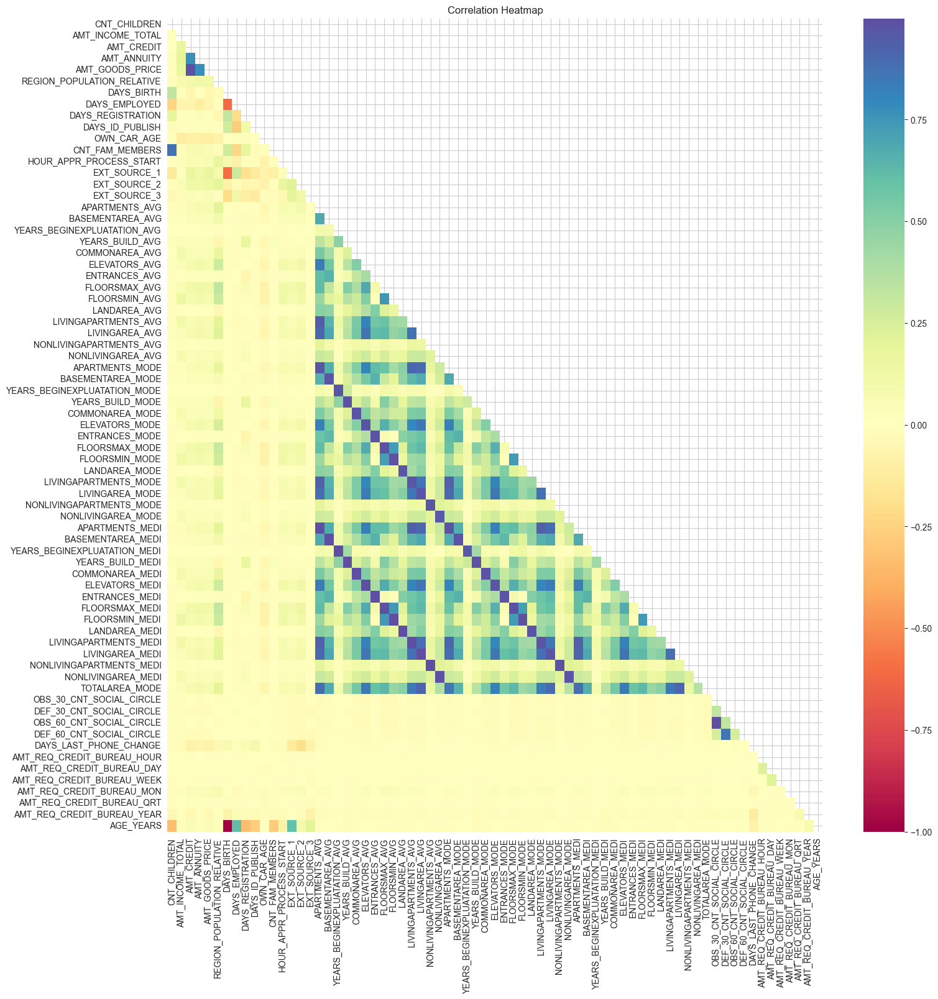

In [112]:
# Heatmap des variables numériques

columns_to_drop = ['SK_ID_CURR'] + list(set(categorical_columns)
                                        - set(['TARGET']))

ext_data = application_train.drop(columns_to_drop + ['TARGET'], axis=1)

plt.figure(figsize = (17, 17))
mask = np.triu(np.ones_like(ext_data.corr()))
    
# Heatmap of correlations
sns.heatmap(ext_data.corr(), mask = mask, cmap = plt.cm.Spectral)
plt.title('Correlation Heatmap');

**Bilan** :
***
- La carte thermique montre bien la valeur ou le niveau de corrélation que chaque variable particulière a avec toutes les autres caractéristiques.
- On peut observer que la plupart de la carte thermique contient une couleur bleue, ce qui indique une très faible valeur de corrélation. Cela implique que la plupart des caractéristiques ne sont effectivement pas corrélées aux autres.
- Cependant, nous pouvons voir des teintes contrastées au milieu de la carte thermique. Ces nuances représentent une valeur élevée de corrélation entre les caractéristiques. Ce sont les caractéristiques qui sont liées aux statistiques des appartements.
- Si nous regardons les variables de l'application_train, nous pouvons clairement voir que les statistiques des appartements sont données en termes de Moyenne, Médiane et Mode, donc on peut s'attendre à ce que la moyenne, la médiane et le mode soient corrélés entre eux. Il convient également de noter que les variables d'une catégorie particulière, par exemple la moyenne, sont également corrélées avec d'autres variables moyennes, telles que le nombre d'ascenseurs, la surface habitable, la surface non habitable, la surface du sous-sol, etc.
- Nous constatons également une forte corrélation entre :
    - AMT_GOODS_PRICE et AMT_CREDIT, 
    - et entre DAYS_EMPLOYED et DAYS_BIRTH.
- Nous ne voulons pas de variables fortement corrélées car elles augmentent la complexité temporelle du modèle sans lui apporter beaucoup de valeur. Par conséquent, nous supprimons les variables intercorrélées.
- Parmi toutes les variables, nous constatons une corrélation élevée pour les variables EXT_SOURCE par rapport à la variable cible. Celles-ci peuvent être importantes pour notre tâche de classification.

### <span style='background:orange'>2.2 Fichier application_test.csv</span>

#### <span style='background:Moccasin'>2.2.1. statistique des variables</span>

- Le fichier **application_test.csv** est constituée de **données statiques relatives aux emprunteurs sans les étiquettes**. 
- Chaque ligne représente une demande de prêt.
- Le dataframe application_test.csv contient l'ensemble de données de test, et est similaire à l'application_train.csv, sauf que la colonne TARGET a été omise, qui doit être prédite à l'aide de modèles prédictifs statistiques et d'apprentissage automatique.

<span style='background:mistyrose'>**Compréhension des variables**</span>

In [137]:
df_var_appli_test = \
    homecredit_columns_description[homecredit_columns_description['Table']
                                   == 'application_{train|test}.csv']
df_var_appli_test.style.hide_index()

Unnamed: 0,Table,Row,Description,Special
1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,nan
2,application_{train|test}.csv,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",nan
5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,nan
6,application_{train|test}.csv,CODE_GENDER,Gender of the client,nan
7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,nan
8,application_{train|test}.csv,FLAG_OWN_REALTY,Flag if client owns a house or flat,nan
9,application_{train|test}.csv,CNT_CHILDREN,Number of children the client has,nan
10,application_{train|test}.csv,AMT_INCOME_TOTAL,Income of the client,nan
11,application_{train|test}.csv,AMT_CREDIT,Credit amount of the loan,nan
12,application_{train|test}.csv,AMT_ANNUITY,Loan annuity,nan


<span style='background:mistyrose'>**Statistiques**</span>

-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_CURR                      int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
FLAG_OWN_REALTY                object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 121, dtype: object

,Nombre par type de variable,% des types de variable
float64,65,53.720000
int64,40,33.060000
object,16,13.220000


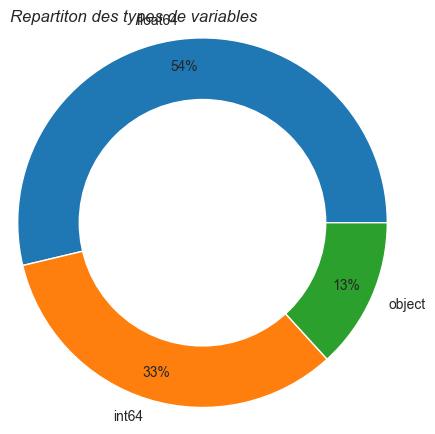

In [138]:
# Types des variables
fonctions_data.affichage_types_var(application_test, True, True, True)

In [139]:
# Résumé des variables qualitatives
fonctions_data.detail_type_var(application_test, type_var='cat')

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
type,object,object,object,object,object,object,object,object,object,object,object,object,object,object,object,object
nb_nan,0.0,0.0,0.0,0.0,911.0,0.0,0.0,0.0,0.0,15605.0,0.0,0.0,32797.0,23619.0,23893.0,22209.0
%_nan,0.0,0.0,0.0,0.0,1.868948,0.0,0.0,0.0,0.0,32.014197,0.0,0.0,67.284179,48.455194,49.017315,45.562531
count,48744,48744,48744,48744,47833,48744,48744,48744,48744,33139,48744,48744,15947,25125,24851,26535
unique,2,2,2,2,7,7,5,5,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,48305,32678,32311,33658,39727,24533,33988,32283,43645,8655,9751,10840,12124,24659,11269,26179


In [140]:
# Résumé des variables qualitatives
fonctions_data.detail_type_var(application_test, type_var='num')

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
type,int64,int64,float64,float64,float64,float64,float64,int64,int64,float64,...,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,6049.0,6049.0,6049.0,6049.0,6049.0,6049.0
%_nan,0.0,0.0,0.0,0.0,0.049237,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,12.409732,12.409732,12.409732,12.409732,12.409732,12.409732
count,48744.0,48744.0,48744.0,48744.0,48720.0,48744.0,48744.0,48744.0,48744.0,48744.0,...,48744.0,48744.0,48744.0,48744.0,42695.0,42695.0,42695.0,42695.0,42695.0,42695.0
mean,277796.67635,0.397054,178431.805855,516740.435561,29426.240209,462618.840473,0.021226,-16068.084605,67485.366322,-4967.652716,...,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,0.709047,101522.591536,365397.004174,16016.368315,336710.21504,0.014428,4325.900393,144348.507136,3552.612035,...,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.0,0.0,26941.5,45000.0,2295.0,45000.0,0.000253,-25195.0,-17463.0,-23722.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,188557.75,0.0,112500.0,260640.0,17973.0,225000.0,0.010006,-19637.0,-2910.0,-7459.25,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,277549.0,0.0,157500.0,450000.0,26199.0,396000.0,0.01885,-15785.0,-1293.0,-4490.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
75%,367555.5,1.0,225000.0,675000.0,37390.5,630000.0,0.028663,-12496.0,-296.0,-1901.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0


Valeurs manquantes :1404419 NaN pour 5898024 données (23.81 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
COMMONAREA_MODE,33495,68.72
COMMONAREA_MEDI,33495,68.72
COMMONAREA_AVG,33495,68.72
NONLIVINGAPARTMENTS_MEDI,33347,68.41
NONLIVINGAPARTMENTS_AVG,33347,68.41
...,...,...
OBS_60_CNT_SOCIAL_CIRCLE,29,0.06
DEF_30_CNT_SOCIAL_CIRCLE,29,0.06
OBS_30_CNT_SOCIAL_CIRCLE,29,0.06
AMT_ANNUITY,24,0.05


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


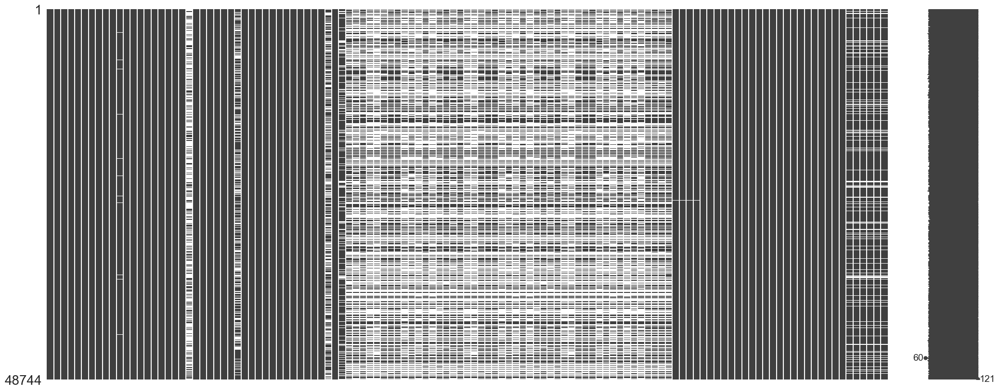

In [141]:
# Visualisation des données manquantes dans le dataset
fonctions_data.get_val_manq(application_test, True, True)

**Bilan** :
***
- Le fichier application_test.csv contient environ **48700 enregistrements** et **121 variables**. 
- Ces variables sont exactement celles qui se trouvent dans le fichier application_train.csv, sauf qu'il s'agit des données de formation.
- Il y a 48700 SK_ID_CURR uniques qui représentent des demandes de prêt uniques.
- La colonne TARGET a été omise et doit être prédite à l'aide de modèles statistiques prédictifs et de modèles d'apprentissage automatique.

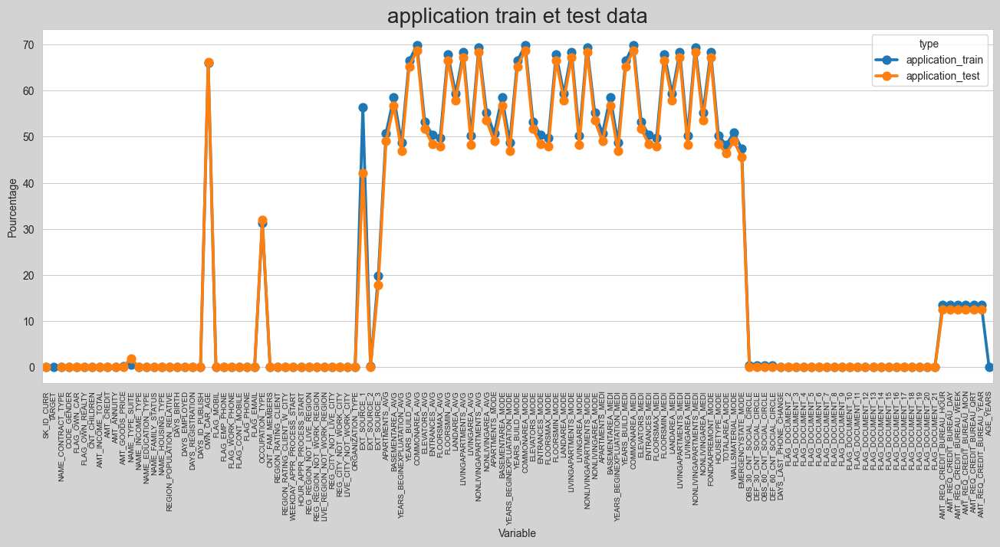

In [190]:
# Comparaison des pourcentages de NaN pour les application_train
# et application_test
fig = plt.figure(figsize=(16, 6))

manq_train = pd.DataFrame((application_train.isnull().sum()) * 100 /
                          application_train.shape[0]).reset_index()
manq_test = pd.DataFrame((application_test.isnull().sum()) * 100 /
                         application_test.shape[0]).reset_index()
manq_train['type'] = 'application_train'
manq_test['type'] = 'application_test'
missing = pd.concat([manq_train, manq_test], axis=0)

sns.pointplot(x = "index", 
              y = 0, 
              hue="type",
              data = missing) 
plt.xticks(rotation=90, fontsize=7)
plt.title('application train et test data', fontsize=20)
plt.ylabel('Pourcentage')
plt.xlabel('Variable')
fig.set_facecolor("lightgrey")
plt.show() 

[Source](https://www.kaggle.com/ozericyer/homecreditdefaultrisk-test-train-eda-1)